# Problem Statement

You are working as a Machine Learning Engineer in an e-commerce company named 'Ebuss'. Ebuss has captured a huge market share in many fields, and it sells the products in various categories such as household essentials, books, personal care products, medicines, cosmetic items, beauty products, electrical appliances, kitchen and dining products and health care products.
As a senior ML Engineer, you are asked to build a model that will improve the recommendations given to the users given their past reviews and ratings. 

 

In order to do this, you planned to build a sentiment-based product recommendation system, which includes the following tasks.

Data sourcing and sentiment analysis \
Building a recommendation system \
Improving the recommendations using the sentiment analysis model \
Deploying the end-to-end project with a user interface 

In this task, you have to analyse product reviews after some text preprocessing steps and build an ML model to get the sentiments corresponding to the users' reviews and ratings for multiple products.

In [1]:
# Import all the required libraries
import json 
import numpy as np
import pandas as pd
import re, nltk, spacy, string
import en_core_web_sm

from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords

nlp = en_core_web_sm.load()
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from plotly.offline import plot
import plotly.graph_objects as go
import plotly.express as px

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from pprint import pprint

from sklearn.model_selection import train_test_split

from sklearn import metrics
from sklearn.metrics import f1_score, recall_score
from sklearn.metrics import r2_score

from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

import time
import os

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Read the data file and get column details
product_df = pd.read_csv("sample30.csv", sep=",")
product_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   id                    30000 non-null  object
 1   brand                 30000 non-null  object
 2   categories            30000 non-null  object
 3   manufacturer          29859 non-null  object
 4   name                  30000 non-null  object
 5   reviews_date          29954 non-null  object
 6   reviews_didPurchase   15932 non-null  object
 7   reviews_doRecommend   27430 non-null  object
 8   reviews_rating        30000 non-null  int64 
 9   reviews_text          30000 non-null  object
 10  reviews_title         29810 non-null  object
 11  reviews_userCity      1929 non-null   object
 12  reviews_userProvince  170 non-null    object
 13  reviews_username      29937 non-null  object
 14  user_sentiment        29999 non-null  object
dtypes: int64(1), object(14)
memory usage

In [3]:
#Check the data in csv
product_df.head(5)

,id,brand,categories,manufacturer,name,reviews_date,reviews_didPurchase,reviews_doRecommend,reviews_rating,reviews_text,reviews_title,reviews_userCity,reviews_userProvince,reviews_username,user_sentiment
0,AV13O1A8GV-KLJ3akUyj,Universal Music,"Movies, Music & Books,Music,R&b,Movies & TV,Mo...",Universal Music Group / Cash Money,Pink Friday: Roman Reloaded Re-Up (w/dvd),2012-11-30T06:21:45.000Z,NaN,NaN,5,i love this album. it's very good. more to the...,Just Awesome,Los Angeles,NaN,joshua,Positive
1,AV14LG0R-jtxr-f38QfS,Lundberg,"Food,Packaged Foods,Snacks,Crackers,Snacks, Co...",Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,2017-07-09T00:00:00.000Z,True,NaN,5,Good flavor. This review was collected as part...,Good,NaN,NaN,dorothy w,Positive
2,AV14LG0R-jtxr-f38QfS,Lundberg,"Food,Packaged Foods,Snacks,Crackers,Snacks, Co...",Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,2017-07-09T00:00:00.000Z,True,NaN,5,Good flavor.,Good,NaN,NaN,dorothy w,Positive
3,AV16khLE-jtxr-f38VFn,K-Y,"Personal Care,Medicine Cabinet,Lubricant/Sperm...",K-Y,K-Y Love Sensuality Pleasure Gel,2016-01-06T00:00:00.000Z,False,False,1,I read through the reviews on here before look...,Disappointed,NaN,NaN,rebecca,Negative
4,AV16khLE-jtxr-f38VFn,K-Y,"Personal Care,Medicine Cabinet,Lubricant/Sperm...",K-Y,K-Y Love Sensuality Pleasure Gel,2016-12-21T00:00:00.000Z,False,False,1,My husband bought this gel for us. The gel cau...,Irritation,NaN,NaN,walker557,Negative


In [4]:
# Check counts for the 5 ratings.
product_df['reviews_rating'].astype('category').value_counts()

5    20831
4     6020
1     1384
3     1345
2      420
Name: reviews_rating, dtype: int64

In [5]:
#Review by user city
product_df['reviews_userCity'].value_counts()

Chicago              34
Houston              32
New York             29
Los Angeles          26
Atlanta              23
                     ..
Township Of Wales     1
Indianapollis         1
Brookings             1
Tuskegee              1
Canyon                1
Name: reviews_userCity, Length: 977, dtype: int64

In [6]:
# Get overview of rating and sentiment
product_df.groupby(['reviews_rating','user_sentiment']).size()

reviews_rating  user_sentiment
1               Negative            597
                Positive            787
2               Negative            140
                Positive            280
3               Negative            220
                Positive           1125
4               Negative            550
                Positive           5470
5               Negative           1860
                Positive          18970
dtype: int64

In [7]:
# Get total of Positive and Negative count
product_df['user_sentiment'].astype('category').value_counts()

Positive    26632
Negative     3367
Name: user_sentiment, dtype: int64

In [8]:
# Check columns for % of missing values
product_df.isna().sum() / len(product_df) * 100

id                       0.000000
brand                    0.000000
categories               0.000000
manufacturer             0.470000
name                     0.000000
reviews_date             0.153333
reviews_didPurchase     46.893333
reviews_doRecommend      8.566667
reviews_rating           0.000000
reviews_text             0.000000
reviews_title            0.633333
reviews_userCity        93.570000
reviews_userProvince    99.433333
reviews_username         0.210000
user_sentiment           0.003333
dtype: float64

In [9]:
# Drop reviews_userCity and reviews_userProvince as these have huge missing values
product_df = product_df.drop(['reviews_userCity','reviews_userProvince'], axis=1)

## EDA

In [10]:
# Derive date from timestamp and derive month and year
product_df['date'] = product_df['reviews_date'].str[:10]
product_df['date'] = pd.to_datetime(product_df['date'], errors='coerce').dt.date
product_df['date'].fillna(product_df['date'].value_counts().idxmax(),inplace=True)
product_df['date'] = pd.to_datetime(product_df.date, format='%Y-%m-%d')
product_df['month'] = product_df['date'].dt.month
product_df['year'] = product_df['date'].dt.year
product_df['date'].head()

0   2012-11-30
1   2017-07-09
2   2017-07-09
3   2016-01-06
4   2016-12-21
Name: date, dtype: datetime64[ns]

In [11]:
#product_df['Year'].value_counts()
product_df.head(1)

,id,brand,categories,manufacturer,name,reviews_date,reviews_didPurchase,reviews_doRecommend,reviews_rating,reviews_text,reviews_title,reviews_username,user_sentiment,date,month,year
0,AV13O1A8GV-KLJ3akUyj,Universal Music,"Movies, Music & Books,Music,R&b,Movies & TV,Mo...",Universal Music Group / Cash Money,Pink Friday: Roman Reloaded Re-Up (w/dvd),2012-11-30T06:21:45.000Z,NaN,NaN,5,i love this album. it's very good. more to the...,Just Awesome,joshua,Positive,2012-11-30,11,2012


<AxesSubplot:xlabel='month'>

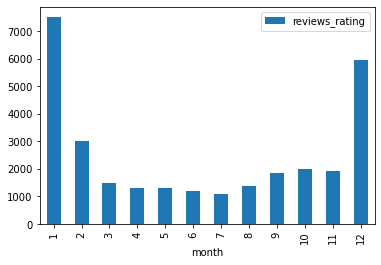

In [12]:
# Plot a graph of Month vs Rating for better visualization
month_by_review =product_df.groupby(['month'])['reviews_rating'].count()
month_by_review = pd.DataFrame(month_by_review)
month_by_review.plot.bar()

In [13]:
# Convert to dataframe
month_by_review = pd.DataFrame(month_by_review)

<AxesSubplot:xlabel='month'>

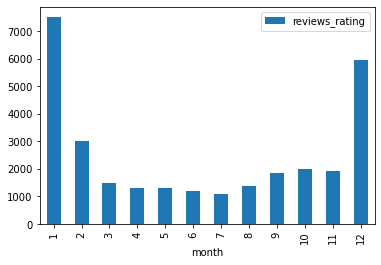

In [14]:
# Plot a graph of Month vs Rating for better visualization
month_by_review.plot.bar()

<AxesSubplot:xlabel='year'>

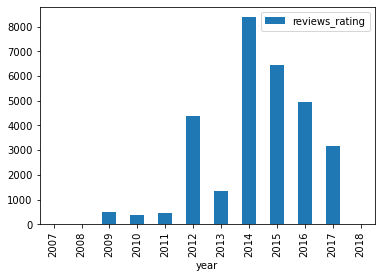

In [15]:
# Plot a graph of Year vs Rating for better visualization
year_by_review =product_df.groupby(['year'])['reviews_rating'].count()
year_by_review = pd.DataFrame(year_by_review)
year_by_review.plot.bar()

<AxesSubplot:xlabel='name'>

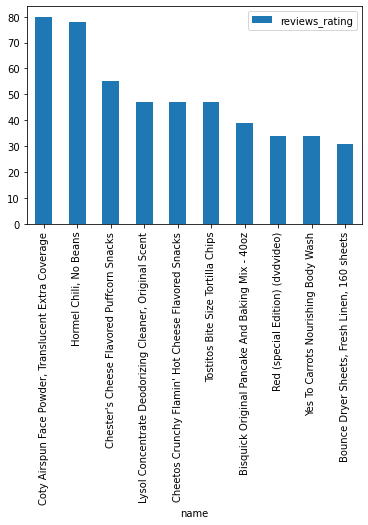

In [16]:
# Plot a graph of products with Positive reviews where users have bought those products
top_positive_review_products=product_df[(product_df['user_sentiment']=='Positive') & ( product_df['reviews_didPurchase'] == True )]
top_positive_review_products=top_positive_review_products.groupby(['name'])['reviews_rating'].count().reset_index()
top_positive_review_products.sort_values(by='reviews_rating',ascending=False).head(10).plot.bar(x='name',y='reviews_rating')


<AxesSubplot:xlabel='name'>

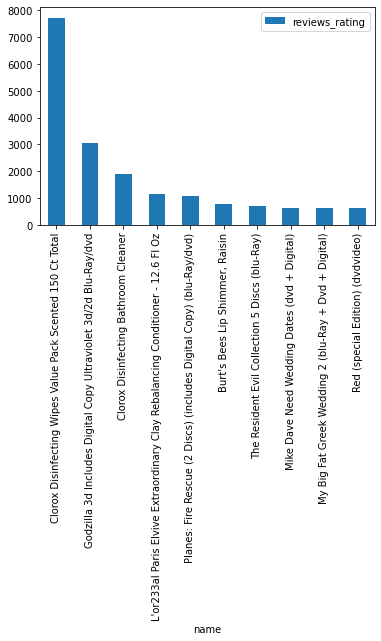

In [17]:
# Plot a graph of products with Positive reviews where users have bought not necessarily bought those products
top_positive_review_products=product_df[product_df['user_sentiment']=='Positive']
top_positive_review_products=top_positive_review_products.groupby(['name'])['reviews_rating'].count().reset_index()
top_positive_review_products.sort_values(by='reviews_rating',ascending=False).head(10).plot.bar(x='name',y='reviews_rating')


<AxesSubplot:xlabel='name'>

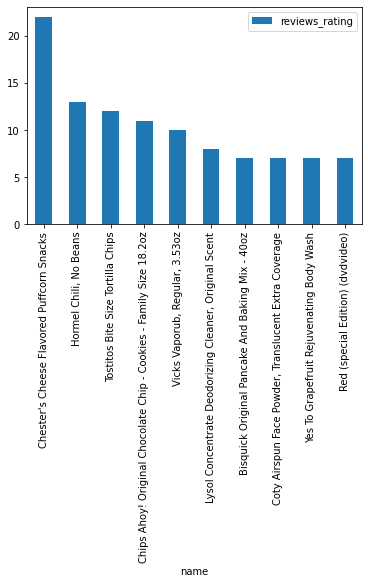

In [18]:
# Plot a graph of products with Negative reviews where users have bought those products
top_negative_review_products=product_df[(product_df['user_sentiment']=='Negative') & ( product_df['reviews_didPurchase'] == True )]
top_negative_review_products=top_negative_review_products.groupby(['name'])['reviews_rating'].count().reset_index()
top_negative_review_products.sort_values(by='reviews_rating',ascending=False).head(10).plot.bar(x='name',y='reviews_rating')


<AxesSubplot:xlabel='name'>

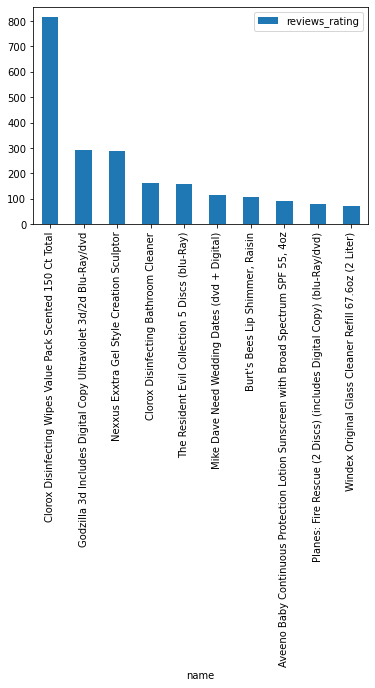

In [19]:
# Plot a graph of products with Negative reviews where users have bought not necessarily bought those products
top_negative_review_products=product_df[product_df['user_sentiment']=='Negative']
top_negative_review_products=top_negative_review_products.groupby(['name'])['reviews_rating'].count().reset_index()
top_negative_review_products.sort_values(by='reviews_rating',ascending=False).head(10).plot.bar(x='name',y='reviews_rating')


<AxesSubplot:>

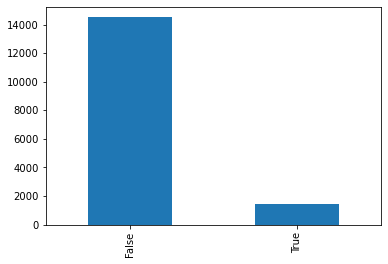

In [20]:
# Plot of users who have given rating and purchased it
product_df['reviews_didPurchase'].value_counts().plot.bar()

In [21]:
# As the total do not come around 30,000 there looks to be lot of blank values.
# Replace it will null
product_df['reviews_didPurchase'].fillna('Null',inplace=True)

<AxesSubplot:>

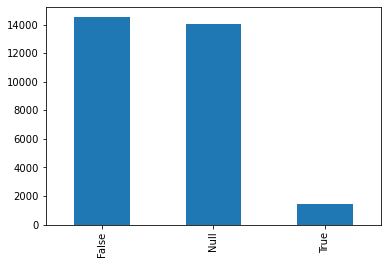

In [22]:
product_df['reviews_didPurchase'].value_counts().plot.bar()

## There are lot of users who have not purchased products but given review.
### Also many users have not given reviews if they have purchased it. Hence we can drop this column reviews_didPurchase after completing EDA. Ihas almost ~50% missing values.

<AxesSubplot:>

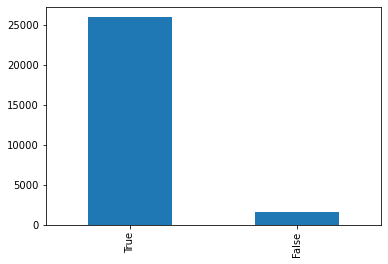

In [23]:
# USers who have purchased and recommended products
product_df['reviews_doRecommend'].value_counts().plot.bar()

In [24]:
# As the total do not come around 30,000 there looks to be some blank values.
# Replace it will null
product_df['reviews_doRecommend'].fillna('Null',inplace=True)

<AxesSubplot:>

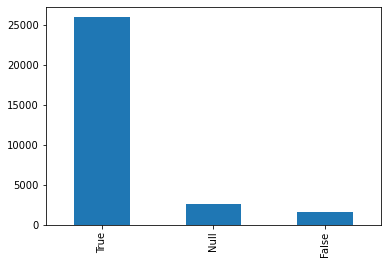

In [25]:
product_df['reviews_doRecommend'].value_counts().plot.bar()

In [26]:
# Compare recommendation vs rating
product_df.groupby(['reviews_doRecommend','reviews_rating'])['reviews_doRecommend'].count()

reviews_doRecommend  reviews_rating
False                1                   841
                     2                   240
                     3                   355
                     4                    50
                     5                    64
True                 1                    45
                     2                    54
                     3                   793
                     4                  5642
                     5                 19346
Null                 1                   498
                     2                   126
                     3                   197
                     4                   328
                     5                  1421
Name: reviews_doRecommend, dtype: int64

### We see ratings are mostly >3 where user have recommended products and mostly <=3 where they have not recommended

In [27]:
# Check user_recommendation vs user_sentiment
product_df.groupby(['reviews_doRecommend','user_sentiment'])['reviews_doRecommend'].count()

reviews_doRecommend  user_sentiment
False                Negative            556
                     Positive            994
True                 Negative           2382
                     Positive          23497
Null                 Negative            429
                     Positive           2141
Name: reviews_doRecommend, dtype: int64

### Product sentiment is usually more Positive when users have recommended it.

In [28]:
# Check user_rating vs user_sentiment
product_df.groupby(['reviews_rating','user_sentiment'])['reviews_rating'].count()

reviews_rating  user_sentiment
1               Negative            597
                Positive            787
2               Negative            140
                Positive            280
3               Negative            220
                Positive           1125
4               Negative            550
                Positive           5470
5               Negative           1860
                Positive          18970
Name: reviews_rating, dtype: int64

### For each rating, there are both positive and negative reviews. But higher ratings have more % of Positive sentiment than lower ratings.
 Here many products have Positive sentiment but rating of 1 and 2. Similarly many products have Negative sentiment, but rating of 3,4,5.
 

In [29]:
#Drop reviews_didPurchase which have many null values (~50%)
product_df = product_df.drop(['reviews_didPurchase'], axis=1)
product_df.head(2)

,id,brand,categories,manufacturer,name,reviews_date,reviews_doRecommend,reviews_rating,reviews_text,reviews_title,reviews_username,user_sentiment,date,month,year
0,AV13O1A8GV-KLJ3akUyj,Universal Music,"Movies, Music & Books,Music,R&b,Movies & TV,Mo...",Universal Music Group / Cash Money,Pink Friday: Roman Reloaded Re-Up (w/dvd),2012-11-30T06:21:45.000Z,Null,5,i love this album. it's very good. more to the...,Just Awesome,joshua,Positive,2012-11-30,11,2012
1,AV14LG0R-jtxr-f38QfS,Lundberg,"Food,Packaged Foods,Snacks,Crackers,Snacks, Co...",Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,2017-07-09T00:00:00.000Z,Null,5,Good flavor. This review was collected as part...,Good,dorothy w,Positive,2017-07-09,7,2017


In [30]:
# Get length of review text for each review
product_df['review_length']=product_df['reviews_text'].apply(lambda x : len(x.split()))

<AxesSubplot:xlabel='reviews_rating', ylabel='review_length'>

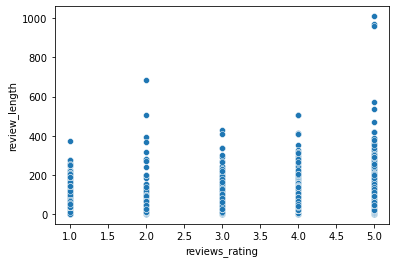

In [31]:
# Plot relation between Rating Vs Review LEngth
sns.scatterplot(x='reviews_rating', y='review_length', data=product_df)

### Higher ratings have usually lengthy review than lower rating

In [32]:
# compare the review text length
product_df.groupby(pd.cut(product_df.review_length, np.arange(0,330,30))).count()

,id,brand,categories,manufacturer,name,reviews_date,reviews_doRecommend,reviews_rating,reviews_text,reviews_title,reviews_username,user_sentiment,date,month,year,review_length
review_length,,,,,,,,,,,,,,,,
"(0, 30]",18591,18591,18591,18471,18591,18580,18591,18591,18591,18465,18570,18591,18591,18591,18591,18591
"(30, 60]",7666,7666,7666,7649,7666,7662,7666,7666,7666,7629,7646,7666,7666,7666,7666,7666
"(60, 90]",2177,2177,2177,2175,2177,2174,2177,2177,2177,2164,2165,2176,2177,2177,2177,2177
"(90, 120]",815,815,815,814,815,809,815,815,815,808,813,815,815,815,815,815
"(120, 150]",332,332,332,332,332,330,332,332,332,327,329,332,332,332,332,332
"(150, 180]",169,169,169,168,169,164,169,169,169,168,169,169,169,169,169,169
"(180, 210]",106,106,106,106,106,103,106,106,106,105,105,106,106,106,106,106
"(210, 240]",43,43,43,43,43,41,43,43,43,43,43,43,43,43,43,43
"(240, 270]",36,36,36,36,36,34,36,36,36,36,33,36,36,36,36,36


In [33]:
# Create the categories based on review length
def review_range(row):
    if row['review_length'] <= 50:
        val = '0-50'
    elif (row['review_length'] > 50 and row['review_length'] <= 150):
        val = '50-150'
    elif (row['review_length'] > 150 and row['review_length'] <= 300):
        val = '150-300'
    elif row['review_length'] > 300:
        val = '> 300'
    return val

In [34]:
product_df['review_category'] = product_df.apply(review_range, axis=1)

In [35]:
product_df.head(3)

,id,brand,categories,manufacturer,name,reviews_date,reviews_doRecommend,reviews_rating,reviews_text,reviews_title,reviews_username,user_sentiment,date,month,year,review_length,review_category
0,AV13O1A8GV-KLJ3akUyj,Universal Music,"Movies, Music & Books,Music,R&b,Movies & TV,Mo...",Universal Music Group / Cash Money,Pink Friday: Roman Reloaded Re-Up (w/dvd),2012-11-30T06:21:45.000Z,Null,5,i love this album. it's very good. more to the...,Just Awesome,joshua,Positive,2012-11-30,11,2012,41,0-50
1,AV14LG0R-jtxr-f38QfS,Lundberg,"Food,Packaged Foods,Snacks,Crackers,Snacks, Co...",Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,2017-07-09T00:00:00.000Z,Null,5,Good flavor. This review was collected as part...,Good,dorothy w,Positive,2017-07-09,7,2017,11,0-50
2,AV14LG0R-jtxr-f38QfS,Lundberg,"Food,Packaged Foods,Snacks,Crackers,Snacks, Co...",Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,2017-07-09T00:00:00.000Z,Null,5,Good flavor.,Good,dorothy w,Positive,2017-07-09,7,2017,2,0-50


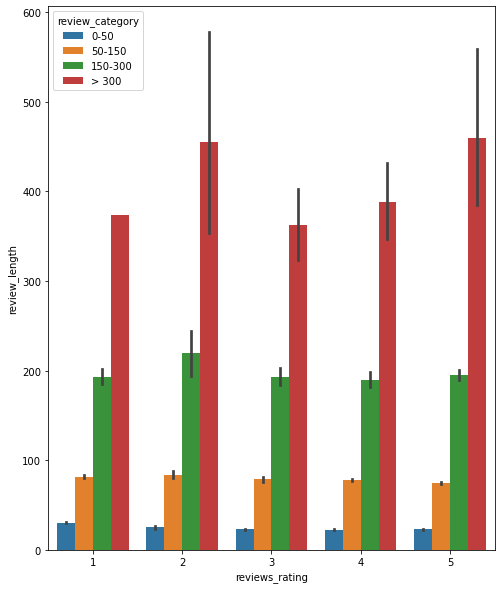

In [36]:
plt.figure (figsize= (8,10))
sns.barplot(x = "reviews_rating", y = "review_length", hue = "review_category", data = product_df)
plt.show()

### There are more users who have given long reviews

# Data Preprocessing

In [37]:
# Find out which user have given most reviews
product_df['reviews_username'].value_counts().head(5)

mike                 41
byamazon customer    41
chris                32
lisa                 16
sandy                15
Name: reviews_username, dtype: int64

In [38]:
top_user_review = product_df[product_df['reviews_username']=='byamazon customer']

In [39]:
# Same user has given different ratings for same product.
top_user_review.groupby(['name','reviews_rating'])['reviews_rating'].count()

name                                                                                reviews_rating
Aveeno Baby Continuous Protection Lotion Sunscreen with Broad Spectrum SPF 55, 4oz  1                  8
                                                                                    2                  1
                                                                                    5                 13
Lundberg Wehani Rice, 25lb                                                          1                  1
                                                                                    4                  4
                                                                                    5                 14
Name: reviews_rating, dtype: int64

In [40]:
#product_df['average_rating']=product_df.groupby(['id','reviews_username'])['reviews_rating'].transform('mean').round(1)

In [41]:
# Write function to clean the text, convert to lowercase and remove all the unnecessary elements.
def clean_text(text):
    
    # make the text lowercase
    text = text.lower()
    lstcleaned = []
    for word in text.split():
        
        # remove text in square bracket
        word = re.sub('\[.*?\]', '', word)
        
        # remove punctuation
        word = re.sub("[^\w\s_']", '', word)
        
        # remove numbers
        if not(re.search("\d+", word) and re.search("[a-zA-Z]", word)):
            lstcleaned.append(word)

    text = " ".join(lstcleaned)
    return text


In [42]:
#Lemmatize the texts
def lemma_text(text):    
    doc = nlp(text)
    return " ".join([token.lemma_ for token in doc])

In [43]:
# Keep only POS tags noun,pronoun,verb and adjective in the reviews.
def getNNtags(text):
    doc1 = nlp(text)
    lstNNtags = []
    for tok in doc1:
        if tok.pos_ == "NOUN" or tok.pos_ == 'PRON' or tok.pos_ == 'ADJ'  or tok.pos_ == 'ADV':
            lstNNtags.append(tok.text)
    return " ".join(lstNNtags)


In [44]:
df_clean = product_df.copy()

In [45]:
# Apply all the above data preprocessing tasks.
df_clean['clean_text'] = df_clean['reviews_text'].apply(clean_text)
df_clean['lemma_review'] = df_clean['reviews_text'].apply(lemma_text)
df_clean['pos_removed'] = df_clean['reviews_text'].apply(getNNtags)
df_clean.head()

,id,brand,categories,manufacturer,name,reviews_date,reviews_doRecommend,reviews_rating,reviews_text,reviews_title,reviews_username,user_sentiment,date,month,year,review_length,review_category,clean_text,lemma_review,pos_removed
0,AV13O1A8GV-KLJ3akUyj,Universal Music,"Movies, Music & Books,Music,R&b,Movies & TV,Mo...",Universal Music Group / Cash Money,Pink Friday: Roman Reloaded Re-Up (w/dvd),2012-11-30T06:21:45.000Z,Null,5,i love this album. it's very good. more to the...,Just Awesome,joshua,Positive,2012-11-30,11,2012,41,0-50,i love this album it's very good more to the h...,I love this album . it be very good . more to ...,i album it very good more hip hop side her cur...
1,AV14LG0R-jtxr-f38QfS,Lundberg,"Food,Packaged Foods,Snacks,Crackers,Snacks, Co...",Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,2017-07-09T00:00:00.000Z,Null,5,Good flavor. This review was collected as part...,Good,dorothy w,Positive,2017-07-09,7,2017,11,0-50,good flavor this review was collected as part ...,good flavor . this review be collect as part o...,Good flavor review part promotion
2,AV14LG0R-jtxr-f38QfS,Lundberg,"Food,Packaged Foods,Snacks,Crackers,Snacks, Co...",Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,2017-07-09T00:00:00.000Z,Null,5,Good flavor.,Good,dorothy w,Positive,2017-07-09,7,2017,2,0-50,good flavor,good flavor .,Good flavor
3,AV16khLE-jtxr-f38VFn,K-Y,"Personal Care,Medicine Cabinet,Lubricant/Sperm...",K-Y,K-Y Love Sensuality Pleasure Gel,2016-01-06T00:00:00.000Z,False,1,I read through the reviews on here before look...,Disappointed,rebecca,Negative,2016-01-06,1,2016,124,50-150,i read through the reviews on here before look...,I read through the review on here before look ...,I reviews here couples lubricants ultimately d...
4,AV16khLE-jtxr-f38VFn,K-Y,"Personal Care,Medicine Cabinet,Lubricant/Sperm...",K-Y,K-Y Love Sensuality Pleasure Gel,2016-12-21T00:00:00.000Z,False,1,My husband bought this gel for us. The gel cau...,Irritation,walker557,Negative,2016-12-21,12,2016,25,0-50,my husband bought this gel for us the gel caus...,my husband buy this gel for we . the gel cause...,My husband gel us gel irritation it it my skin...


In [46]:
 # Remove all the stopwords in English language
stop = stopwords.words('english')
df_clean['stop_removed'] = df_clean['pos_removed'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))

In [47]:
# View the cleaned reviews by checking full text
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)
df_clean.head(3)

,id,brand,categories,manufacturer,name,reviews_date,reviews_doRecommend,reviews_rating,reviews_text,reviews_title,reviews_username,user_sentiment,date,month,year,review_length,review_category,clean_text,lemma_review,pos_removed,stop_removed
0,AV13O1A8GV-KLJ3akUyj,Universal Music,"Movies, Music & Books,Music,R&b,Movies & TV,Movie Bundles & Collections,CDs & Vinyl,Rap & Hip-Hop,Bass,Music on CD or Vinyl,Rap,Hip-Hop,Mainstream Rap,Pop Rap",Universal Music Group / Cash Money,Pink Friday: Roman Reloaded Re-Up (w/dvd),2012-11-30T06:21:45.000Z,Null,5,i love this album. it's very good. more to the hip hop side than her current pop sound.. SO HYPE! i listen to this everyday at the gym! i give it 5star rating all the way. her metaphors are just crazy.,Just Awesome,joshua,Positive,2012-11-30,11,2012,41,0-50,i love this album it's very good more to the hip hop side than her current pop sound so hype i listen to this everyday at the gym i give it rating all the way her metaphors are just crazy,I love this album . it be very good . more to the hip hop side than her current pop sound .. so HYPE ! I listen to this everyday at the gym ! I give it 5star rating all the way . her metaphor be just crazy .,i album it very good more hip hop side her current pop sound SO HYPE i this everyday gym i it rating way her metaphors just crazy,album good hip hop side current pop sound SO HYPE everyday gym rating way metaphors crazy
1,AV14LG0R-jtxr-f38QfS,Lundberg,"Food,Packaged Foods,Snacks,Crackers,Snacks, Cookies & Chips,Rice Cakes,Cakes",Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,2017-07-09T00:00:00.000Z,Null,5,Good flavor. This review was collected as part of a promotion.,Good,dorothy w,Positive,2017-07-09,7,2017,11,0-50,good flavor this review was collected as part of a promotion,good flavor . this review be collect as part of a promotion .,Good flavor review part promotion,Good flavor review part promotion
2,AV14LG0R-jtxr-f38QfS,Lundberg,"Food,Packaged Foods,Snacks,Crackers,Snacks, Cookies & Chips,Rice Cakes,Cakes",Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,2017-07-09T00:00:00.000Z,Null,5,Good flavor.,Good,dorothy w,Positive,2017-07-09,7,2017,2,0-50,good flavor,good flavor .,Good flavor,Good flavor


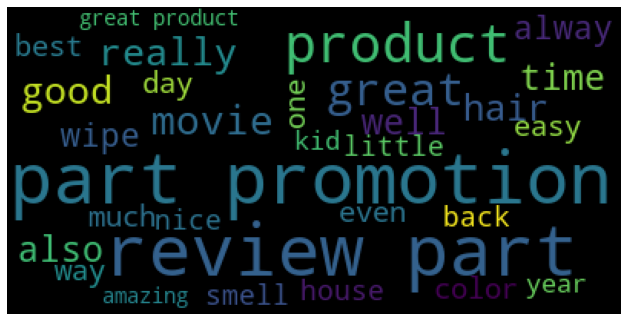

In [48]:
# Check top 30 words in reviews using wordcloud
import os
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from wordcloud import WordCloud
stoplist = set(stopwords.words("english"))

wordcloud = WordCloud(stopwords=stoplist,max_words=30).generate(str(df_clean['stop_removed']))

print(wordcloud)
#fig = plt.figure(1)
plt.figure (figsize= (11,11))
plt.imshow(wordcloud)
plt.axis('off')
plt.show();

## Feature Extraction

In [49]:
#Keeping only the relevant columns which are required for product recommendation
df_feature=df_clean[['reviews_username','name','stop_removed','reviews_rating','user_sentiment']]
df_feature.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   reviews_username  29937 non-null  object
 1   name              30000 non-null  object
 2   stop_removed      30000 non-null  object
 3   reviews_rating    30000 non-null  int64 
 4   user_sentiment    29999 non-null  object
dtypes: int64(1), object(4)
memory usage: 1.1+ MB


In [50]:
# Convert user sentiment as 1 for Positive and 0 for NEgative
df_feature['stop_removed'] = df_feature['stop_removed'].astype(str)
df_feature['user_sentiment']=df_feature['user_sentiment'].map(lambda x : 1 if x=='Positive' else 0)

In [51]:
df_feature.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   reviews_username  29937 non-null  object
 1   name              30000 non-null  object
 2   stop_removed      30000 non-null  object
 3   reviews_rating    30000 non-null  int64 
 4   user_sentiment    30000 non-null  int64 
dtypes: int64(2), object(3)
memory usage: 1.1+ MB


In [52]:
#create pickle file
import pickle as pickle
pickle.dump(df_feature, open("data.pkl","wb"))

In [53]:
df_feature.head(1)

,reviews_username,name,stop_removed,reviews_rating,user_sentiment
0,joshua,Pink Friday: Roman Reloaded Re-Up (w/dvd),album good hip hop side current pop sound SO HYPE everyday gym rating way metaphors crazy,5,1


In [54]:
# Feature extraction using tf-idf
tf_idf_vectorizer = TfidfVectorizer(ngram_range=(1,2))#,analyzer='word',stop_words= 'english')
tf_idf_vectorizer.fit(df_feature['stop_removed'])
X = tf_idf_vectorizer.transform(df_feature['stop_removed'])
y = df_feature['user_sentiment']

In [55]:
#Saving tf-idf vectorizer in pickel file format
pickle.dump(tf_idf_vectorizer,open('tf_idf_vectorizer.pkl','wb'))
#loading pickle object
tf_idf_vectorizer = pickle.load(open('tf_idf_vectorizer.pkl','rb'))

In [56]:
#Lets split train test data
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7)


In [57]:
#Checking Class Imbalance 

df_feature.groupby(['user_sentiment']).count()

,reviews_username,name,stop_removed,reviews_rating
user_sentiment,,,,
0,3358,3368,3368,3368
1,26579,26632,26632,26632


In [58]:
X_train

<21000x156789 sparse matrix of type '<class 'numpy.float64'>'
	with 449372 stored elements in Compressed Sparse Row format>

In [59]:
# Since there are more Positive reviews than Negative reviews, we need to handle class imbalance.
from collections import Counter
from imblearn import over_sampling
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE
from sklearn.metrics.pairwise import pairwise_distances
from sklearn.model_selection import RandomizedSearchCV
counter = Counter(y_train)
print("Before", counter)


#oversampling using SMOTE
smote = SMOTE()
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

counter = Counter(y_train_smote)
print("After", counter)

Before Counter({1: 18623, 0: 2377})
After Counter({1: 18623, 0: 18623})


#### Now the class imbalance is corrected.

In [60]:
# Create function to calculate metrics for test and train data.
def mymetric(y_test, y_test_pred):
    confusion = metrics.confusion_matrix( y_test, y_test_pred )
    print("\n\nConfusion: \n", confusion)

    accuracy = metrics.accuracy_score(y_test, y_test_pred)
    print("\n\nOverall accuracy: ", accuracy)

    f1score = f1_score(y_test, y_test_pred, average='weighted')
    print("\n\nf1_score: ", f1score)
    
    return [accuracy, f1score]

#### Let's start creating all the models.

## Naive Bayes Model

In [61]:
# Create Naive Bayes model
clf = MultinomialNB().fit(X_train, y_train)
y_test_pred = clf.predict(X_test)

#Calculate Test metrics
df_metric = pd.DataFrame([mymetric(y_test, y_test_pred)], \
                         columns=['Accuracy', 'F1Score'], index=['Multinomial_Naive_Bayes_Test'])



Confusion: 
 [[   0  991]
 [   0 8009]]


Overall accuracy:  0.8898888888888888


f1_score:  0.8380410501629856


In [62]:
#Calculate Train metrics
y_train_pred = clf.predict(X_train)
df_metric = pd.concat([df_metric, \
                      pd.DataFrame([mymetric(y_train, y_train_pred)], \
                                   columns=['Accuracy', 'F1Score'], index=['Multinomial_Naive_Bayes_Train'])])



Confusion: 
 [[    0  2377]
 [    0 18623]]


Overall accuracy:  0.8868095238095238


f1_score:  0.8336094572296273


### Logistic Regression Model

In [63]:
# Logicstic Regression Classification
lr = LogisticRegression(multi_class='multinomial', solver='saga')
lr.fit(X_train, y_train)

LogisticRegression(multi_class='multinomial', solver='saga')

In [64]:
y_train_pred = lr.predict(X_train)
y_test_pred = lr.predict(X_test)

In [65]:
df_metric = pd.concat([df_metric, \
                      pd.DataFrame([mymetric(y_train, y_train_pred)], \
                                   columns=['Accuracy', 'F1Score'], index=['Logistic_Regression_Train'])])



Confusion: 
 [[  942  1435]
 [   14 18609]]


Overall accuracy:  0.931


f1_score:  0.9175590431880492


In [66]:
df_metric = pd.concat([df_metric, \
                      pd.DataFrame([mymetric(y_test, y_test_pred)], \
                                   columns=['Accuracy', 'F1Score'], index=['Logistic_Regression_Test'])])



Confusion: 
 [[ 132  859]
 [  13 7996]]


Overall accuracy:  0.9031111111111111


f1_score:  0.8694639119770277


### Random Forest

In [67]:
# Random Forest Model
rf = RandomForestClassifier(n_estimators=100)
rf.fit(X_train, y_train)

RandomForestClassifier()

In [68]:
y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)

In [69]:
df_metric = pd.concat([df_metric, \
                      pd.DataFrame([mymetric(y_train, y_train_pred)], \
                                   columns=['Accuracy', 'F1Score'], index=['Random_Forest_Train'])])



Confusion: 
 [[ 2322    55]
 [    7 18616]]


Overall accuracy:  0.9970476190476191


f1_score:  0.9970344622421093


In [70]:
df_metric = pd.concat([df_metric, \
                      pd.DataFrame([mymetric(y_test, y_test_pred)], \
                                   columns=['Accuracy', 'F1Score'], index=['Random_Forest_Test'])])



Confusion: 
 [[ 201  790]
 [  35 7974]]


Overall accuracy:  0.9083333333333333


f1_score:  0.8821941660130129


In [71]:
df_metric

,Accuracy,F1Score
Multinomial_Naive_Bayes_Test,0.889889,0.838041
Multinomial_Naive_Bayes_Train,0.886810,0.833609
Logistic_Regression_Train,0.931000,0.917559
Logistic_Regression_Test,0.903111,0.869464
Random_Forest_Train,0.997048,0.997034
Random_Forest_Test,0.908333,0.882194


In [72]:
# Since LR model gives best performance out of 3 with test and train perform better, we will select this.
pickle.dump(lr, open('logistic_regression_model.pkl', 'wb'))
final_ml_model =  pickle.load(open('logistic_regression_model.pkl', 'rb'))

## Recommendation System

In [73]:
# Get the original data
product_df=pd.read_csv("sample30.csv", sep=',')

In [74]:
# Get the important columns
recom_df=product_df[['name','reviews_username','reviews_rating']]

In [75]:
recom_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   name              30000 non-null  object
 1   reviews_username  29937 non-null  object
 2   reviews_rating    30000 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 703.2+ KB


In [76]:
# Remove rows with no user listed
recom_df = recom_df[~recom_df.reviews_username.isna()]

In [77]:
recom_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29937 entries, 0 to 29999
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   name              29937 non-null  object
 1   reviews_username  29937 non-null  object
 2   reviews_rating    29937 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 935.5+ KB


In [78]:
#Split the data into train and test datasets

train, test = train_test_split(recom_df, test_size=0.30, random_state=12)

print(train.shape)
print(test.shape)

(20955, 3)
(8982, 3)


In [79]:
# Create a user vs product matrix
df_pivot = train.pivot_table(
    index='reviews_username',
    columns='name',
    values='reviews_rating',
).fillna(0)


In [80]:
df_pivot.head(4)

name,0.6 Cu. Ft. Letter A4 Size Waterproof 30 Min. Fire File Chest,100:Complete First Season (blu-Ray),2017-2018 Brownline174 Duraflex 14-Month Planner 8 1/2 X 11 Black,"2x Ultra Era with Oxi Booster, 50fl oz",4C Grated Parmesan Cheese 100% Natural 8oz Shaker,5302050 15/16 FCT/HOSE ADAPTOR,Africa's Best No-Lye Dual Conditioning Relaxer System Super,Alberto VO5 Salon Series Smooth Plus Sleek Shampoo,Alex Cross (dvdvideo),"All,bran Complete Wheat Flakes, 18 Oz.",Ambi Complexion Cleansing Bar,Annie's Homegrown Deluxe Elbows & Four Cheese Sauce,Annie's Homegrown Gluten Free Double Chocolate Chip Granola Bars,Arrid Extra Dry Anti-Perspirant Deodorant Spray Regular,"Aussie Aussome Volume Shampoo, 13.5 Oz","Australian Gold Exotic Blend Lotion, SPF 4","Aveeno Baby Continuous Protection Lotion Sunscreen with Broad Spectrum SPF 55, 4oz",Avery174 11-1/4 X 9-1/4 Index Maker Extra Wide Label Dividers With 5 Tab - Clear (5 Sets Per Pack),"Avery174 Ready Index Contemporary Table Of Contents Divider, 1-8, Multi, Letter",Axe Dry Anti-Perspirant Deodorant Invisible Solid Phoenix,"BRIDGESTONE 130/70ZR18M/C(63W)FRONT EXEDRA G851, CRUISER RADL","Banana Boat Sunless Summer Color Self Tanning Lotion, Light To Medium",Barielle Nail Rebuilding Protein,"Batherapy Natural Mineral Bath Sport Liquid, 16 oz",Baxter Of California Cream Pomade,"Beanitos Bean Chips, Simply Pinto Bean",Bedtime Originals Pinkie Musical Mobile,"Ben & Jerry's Coffee, Coffee Buzzbuzzbuzz! Ice Cream, Pint","Better Built 74010862 Bet74010862 60In Crossover Two Lid, Deep, Truck Tool Box",Bi-O-kleen Spray & Wipe All Purpose Cleaner,Bilbao Nightstand Gray Oak - South Shore,Bill Glor Gaither - Church In The Wildwood (cd),Bisquick Original Pancake And Baking Mix - 40oz,Black Front Loading Frame Set (8.5x11) Set Of 12,Black Sister's Revenge (dvd),Blue Anchor Design Throw Pillow (18x18) - Rizzy Home,"Bodycology Nourishing Body Cream, Pretty In Paris",Boraam Sonoma Kitchen Cart With Wire Brush Gray - Maaya Home,"Bounce Dryer Sheets, Fresh Linen, 160 sheets",Bumble Bee Solid White Albacore In Water - 5 Oz,"Burt's Bees Lip Shimmer, Raisin","Burt's Bees Lip Shimmer, Watermelon",Calvin Klein Secret Obsession Eau De Parfum,"Candy Pink Plastic Cups, 20 pk",Cantu Coconut Milk Shine Hold Mist - 8oz,Care Free Curl Gold Instant Activator,"Caress Moisturizing Body Bar Natural Silk, 4.75oz",Cars Toon: Mater's Tall Tales,Ceiling Fan With Light White 14.2 X 29.9 X 9.2 - Hunter Fan,CeraVe SA Renewing Cream,"Cetaphil Gentle Skin Cleanser, 2oz",Charcoal Stone Toothbrush Holder Gray,Cheetos Crunchy Flamin' Hot Cheese Flavored Snacks,Chester's Cheese Flavored Puffcorn Snacks,Chex Muddy Buddies Brownie Supreme Snack Mix,Chips Ahoy! Original Chocolate Chip - Cookies - Family Size 18.2oz,Chips Deluxe Soft 'n Chewy Cookies,Chobani174 Strawberry On The Bottom Non-Fat Greek Yogurt - 5.3oz,Citrus Magic Instant Spot & Stain Remover,Clambake (dvd),Clear Scalp & Hair Therapy Total Care Nourishing Shampoo,Clorox Disinfecting Bathroom Cleaner,Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total,Cococare 100% Natural Castor Oil,"Colorganics Lipstick, Cayenne",Concept Housewares 36 Natural Wood ceiling mounted pot rack,Coola Organic Sunscreen Classic Face Cucumber SPF 30,"Coty Airspun Face Powder, Translucent Extra Coverage",Craft Punch Giga Scallop Circle 45 24687534 To 334,"Creme Of Nature Intensive Conditioning Treatment, 32",Cuisinart174 Electric Juicer - Stainless Steel Cje-1000,D-Con Mice Bait Station - 3ct,Dark Shadows (includes Digital Copy) (ultraviolet) (dvdvideo),Delta Single Handle Shower Faucet,"Dermalogica Special Cleansing Gel, 8.4oz",Diet Canada Dry Ginger Ale - 12pk/12 Fl Oz Cans,Doc Mcstuffins: Friendship Is The Best Medicine,Eagle Fat Free Sweetened Condensed Milk,Elvis Presley - Girl Happy (cd),Equals (blu-Ray),Every Man Jack Pomade Signature Mint Scent,Fantasy Fields Lil' Sports Fan Step Stool - Teamson,Feit 60-Watt A19 Gu24 Base Led Light Bulb - Soft White,"Finish Gelpacs Dishwasher Detergent, Or

In [81]:
dummy_train = train.copy()
dummy_train.head(5)

,name,reviews_username,reviews_rating
27729,Planes: Fire Rescue (2 Discs) (includes Digital Copy) (blu-Ray/dvd),stevieboy23,5
17120,"Lundberg Wehani Rice, 25lb",byo.kelly,5
22028,Yes To Grapefruit Rejuvenating Body Wash,linda h,3
16308,"Burt's Bees Lip Shimmer, Raisin",cocoacrazy,5
19457,Clorox Disinfecting Bathroom Cleaner,vanessavast,5


In [82]:
dummy_train['reviews_rating'].value_counts()

5    14612
4    4138 
1    962  
3    958  
2    285  
Name: reviews_rating, dtype: int64

In [83]:
#The products not rated by user is marked as 1 for prediction. 

dummy_train['reviews_rating'] = dummy_train['reviews_rating'].apply(lambda x: 0 if x>=1 else 1)

In [84]:
# Create matrix and fill all missing values with 1
dummy_train = dummy_train.pivot_table(
    index='reviews_username',
    columns='name',
    values='reviews_rating'
).fillna(1)


dummy_train.head()

name,0.6 Cu. Ft. Letter A4 Size Waterproof 30 Min. Fire File Chest,100:Complete First Season (blu-Ray),2017-2018 Brownline174 Duraflex 14-Month Planner 8 1/2 X 11 Black,"2x Ultra Era with Oxi Booster, 50fl oz",4C Grated Parmesan Cheese 100% Natural 8oz Shaker,5302050 15/16 FCT/HOSE ADAPTOR,Africa's Best No-Lye Dual Conditioning Relaxer System Super,Alberto VO5 Salon Series Smooth Plus Sleek Shampoo,Alex Cross (dvdvideo),"All,bran Complete Wheat Flakes, 18 Oz.",Ambi Complexion Cleansing Bar,Annie's Homegrown Deluxe Elbows & Four Cheese Sauce,Annie's Homegrown Gluten Free Double Chocolate Chip Granola Bars,Arrid Extra Dry Anti-Perspirant Deodorant Spray Regular,"Aussie Aussome Volume Shampoo, 13.5 Oz","Australian Gold Exotic Blend Lotion, SPF 4","Aveeno Baby Continuous Protection Lotion Sunscreen with Broad Spectrum SPF 55, 4oz",Avery174 11-1/4 X 9-1/4 Index Maker Extra Wide Label Dividers With 5 Tab - Clear (5 Sets Per Pack),"Avery174 Ready Index Contemporary Table Of Contents Divider, 1-8, Multi, Letter",Axe Dry Anti-Perspirant Deodorant Invisible Solid Phoenix,"BRIDGESTONE 130/70ZR18M/C(63W)FRONT EXEDRA G851, CRUISER RADL","Banana Boat Sunless Summer Color Self Tanning Lotion, Light To Medium",Barielle Nail Rebuilding Protein,"Batherapy Natural Mineral Bath Sport Liquid, 16 oz",Baxter Of California Cream Pomade,"Beanitos Bean Chips, Simply Pinto Bean",Bedtime Originals Pinkie Musical Mobile,"Ben & Jerry's Coffee, Coffee Buzzbuzzbuzz! Ice Cream, Pint","Better Built 74010862 Bet74010862 60In Crossover Two Lid, Deep, Truck Tool Box",Bi-O-kleen Spray & Wipe All Purpose Cleaner,Bilbao Nightstand Gray Oak - South Shore,Bill Glor Gaither - Church In The Wildwood (cd),Bisquick Original Pancake And Baking Mix - 40oz,Black Front Loading Frame Set (8.5x11) Set Of 12,Black Sister's Revenge (dvd),Blue Anchor Design Throw Pillow (18x18) - Rizzy Home,"Bodycology Nourishing Body Cream, Pretty In Paris",Boraam Sonoma Kitchen Cart With Wire Brush Gray - Maaya Home,"Bounce Dryer Sheets, Fresh Linen, 160 sheets",Bumble Bee Solid White Albacore In Water - 5 Oz,"Burt's Bees Lip Shimmer, Raisin","Burt's Bees Lip Shimmer, Watermelon",Calvin Klein Secret Obsession Eau De Parfum,"Candy Pink Plastic Cups, 20 pk",Cantu Coconut Milk Shine Hold Mist - 8oz,Care Free Curl Gold Instant Activator,"Caress Moisturizing Body Bar Natural Silk, 4.75oz",Cars Toon: Mater's Tall Tales,Ceiling Fan With Light White 14.2 X 29.9 X 9.2 - Hunter Fan,CeraVe SA Renewing Cream,"Cetaphil Gentle Skin Cleanser, 2oz",Charcoal Stone Toothbrush Holder Gray,Cheetos Crunchy Flamin' Hot Cheese Flavored Snacks,Chester's Cheese Flavored Puffcorn Snacks,Chex Muddy Buddies Brownie Supreme Snack Mix,Chips Ahoy! Original Chocolate Chip - Cookies - Family Size 18.2oz,Chips Deluxe Soft 'n Chewy Cookies,Chobani174 Strawberry On The Bottom Non-Fat Greek Yogurt - 5.3oz,Citrus Magic Instant Spot & Stain Remover,Clambake (dvd),Clear Scalp & Hair Therapy Total Care Nourishing Shampoo,Clorox Disinfecting Bathroom Cleaner,Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total,Cococare 100% Natural Castor Oil,"Colorganics Lipstick, Cayenne",Concept Housewares 36 Natural Wood ceiling mounted pot rack,Coola Organic Sunscreen Classic Face Cucumber SPF 30,"Coty Airspun Face Powder, Translucent Extra Coverage",Craft Punch Giga Scallop Circle 45 24687534 To 334,"Creme Of Nature Intensive Conditioning Treatment, 32",Cuisinart174 Electric Juicer - Stainless Steel Cje-1000,D-Con Mice Bait Station - 3ct,Dark Shadows (includes Digital Copy) (ultraviolet) (dvdvideo),Delta Single Handle Shower Faucet,"Dermalogica Special Cleansing Gel, 8.4oz",Diet Canada Dry Ginger Ale - 12pk/12 Fl Oz Cans,Doc Mcstuffins: Friendship Is The Best Medicine,Eagle Fat Free Sweetened Condensed Milk,Elvis Presley - Girl Happy (cd),Equals (blu-Ray),Every Man Jack Pomade Signature Mint Scent,Fantasy Fields Lil' Sports Fan Step Stool - Teamson,Feit 60-Watt A19 Gu24 Base Led Light Bulb - Soft White,"Finish Gelpacs Dishwasher Detergent, Or

## User based similarity

In [85]:
#User Similarity Matrix via pairwise_distance function

user_correlation = 1 - pairwise_distances(df_pivot, metric='cosine')
user_correlation[np.isnan(user_correlation)] = 0
print(user_correlation)

[[1.        0.        0.        ... 0.        0.        0.       ]
 [0.        1.        0.        ... 0.        0.9486833 0.       ]
 [0.        0.        1.        ... 0.        0.        0.       ]
 ...
 [0.        0.        0.        ... 1.        0.        1.       ]
 [0.        0.9486833 0.        ... 0.        1.        0.       ]
 [0.        0.        0.        ... 1.        0.        1.       ]]


## Adjusted Cosine

In [86]:
# Create a user-product matrix.

df_pivot = train.pivot_table(
    index='reviews_username',
    columns='name',
    values='reviews_rating'
)

In [87]:
df_pivot

In [88]:
# Take inverse of matrix and subtract from mean.
mean = np.nanmean(df_pivot, axis=1)
df_subtracted = (df_pivot.T-mean).T

df_subtracted.head()

name,0.6 Cu. Ft. Letter A4 Size Waterproof 30 Min. Fire File Chest,100:Complete First Season (blu-Ray),2017-2018 Brownline174 Duraflex 14-Month Planner 8 1/2 X 11 Black,"2x Ultra Era with Oxi Booster, 50fl oz",4C Grated Parmesan Cheese 100% Natural 8oz Shaker,5302050 15/16 FCT/HOSE ADAPTOR,Africa's Best No-Lye Dual Conditioning Relaxer System Super,Alberto VO5 Salon Series Smooth Plus Sleek Shampoo,Alex Cross (dvdvideo),"All,bran Complete Wheat Flakes, 18 Oz.",Ambi Complexion Cleansing Bar,Annie's Homegrown Deluxe Elbows & Four Cheese Sauce,Annie's Homegrown Gluten Free Double Chocolate Chip Granola Bars,Arrid Extra Dry Anti-Perspirant Deodorant Spray Regular,"Aussie Aussome Volume Shampoo, 13.5 Oz","Australian Gold Exotic Blend Lotion, SPF 4","Aveeno Baby Continuous Protection Lotion Sunscreen with Broad Spectrum SPF 55, 4oz",Avery174 11-1/4 X 9-1/4 Index Maker Extra Wide Label Dividers With 5 Tab - Clear (5 Sets Per Pack),"Avery174 Ready Index Contemporary Table Of Contents Divider, 1-8, Multi, Letter",Axe Dry Anti-Perspirant Deodorant Invisible Solid Phoenix,"BRIDGESTONE 130/70ZR18M/C(63W)FRONT EXEDRA G851, CRUISER RADL","Banana Boat Sunless Summer Color Self Tanning Lotion, Light To Medium",Barielle Nail Rebuilding Protein,"Batherapy Natural Mineral Bath Sport Liquid, 16 oz",Baxter Of California Cream Pomade,"Beanitos Bean Chips, Simply Pinto Bean",Bedtime Originals Pinkie Musical Mobile,"Ben & Jerry's Coffee, Coffee Buzzbuzzbuzz! Ice Cream, Pint","Better Built 74010862 Bet74010862 60In Crossover Two Lid, Deep, Truck Tool Box",Bi-O-kleen Spray & Wipe All Purpose Cleaner,Bilbao Nightstand Gray Oak - South Shore,Bill Glor Gaither - Church In The Wildwood (cd),Bisquick Original Pancake And Baking Mix - 40oz,Black Front Loading Frame Set (8.5x11) Set Of 12,Black Sister's Revenge (dvd),Blue Anchor Design Throw Pillow (18x18) - Rizzy Home,"Bodycology Nourishing Body Cream, Pretty In Paris",Boraam Sonoma Kitchen Cart With Wire Brush Gray - Maaya Home,"Bounce Dryer Sheets, Fresh Linen, 160 sheets",Bumble Bee Solid White Albacore In Water - 5 Oz,"Burt's Bees Lip Shimmer, Raisin","Burt's Bees Lip Shimmer, Watermelon",Calvin Klein Secret Obsession Eau De Parfum,"Candy Pink Plastic Cups, 20 pk",Cantu Coconut Milk Shine Hold Mist - 8oz,Care Free Curl Gold Instant Activator,"Caress Moisturizing Body Bar Natural Silk, 4.75oz",Cars Toon: Mater's Tall Tales,Ceiling Fan With Light White 14.2 X 29.9 X 9.2 - Hunter Fan,CeraVe SA Renewing Cream,"Cetaphil Gentle Skin Cleanser, 2oz",Charcoal Stone Toothbrush Holder Gray,Cheetos Crunchy Flamin' Hot Cheese Flavored Snacks,Chester's Cheese Flavored Puffcorn Snacks,Chex Muddy Buddies Brownie Supreme Snack Mix,Chips Ahoy! Original Chocolate Chip - Cookies - Family Size 18.2oz,Chips Deluxe Soft 'n Chewy Cookies,Chobani174 Strawberry On The Bottom Non-Fat Greek Yogurt - 5.3oz,Citrus Magic Instant Spot & Stain Remover,Clambake (dvd),Clear Scalp & Hair Therapy Total Care Nourishing Shampoo,Clorox Disinfecting Bathroom Cleaner,Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total,Cococare 100% Natural Castor Oil,"Colorganics Lipstick, Cayenne",Concept Housewares 36 Natural Wood ceiling mounted pot rack,Coola Organic Sunscreen Classic Face Cucumber SPF 30,"Coty Airspun Face Powder, Translucent Extra Coverage",Craft Punch Giga Scallop Circle 45 24687534 To 334,"Creme Of Nature Intensive Conditioning Treatment, 32",Cuisinart174 Electric Juicer - Stainless Steel Cje-1000,D-Con Mice Bait Station - 3ct,Dark Shadows (includes Digital Copy) (ultraviolet) (dvdvideo),Delta Single Handle Shower Faucet,"Dermalogica Special Cleansing Gel, 8.4oz",Diet Canada Dry Ginger Ale - 12pk/12 Fl Oz Cans,Doc Mcstuffins: Friendship Is The Best Medicine,Eagle Fat Free Sweetened Condensed Milk,Elvis Presley - Girl Happy (cd),Equals (blu-Ray),Every Man Jack Pomade Signature Mint Scent,Fantasy Fields Lil' Sports Fan Step Stool - Teamson,Feit 60-Watt A19 Gu24 Base Led Light Bulb - Soft White,"Finish Gelpacs Dishwasher Detergent, Or

In [89]:
#Creating the User Similarity Matrix using pairwise_distance function

user_correlation = 1 - pairwise_distances(df_subtracted.fillna(0), metric='cosine')
user_correlation[np.isnan(user_correlation)] = 0

print(user_correlation)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [90]:
user_correlation.shape

(18188, 18188)

### Prediction - User User

In [91]:
# Replace negative average with zeros as we need to predict positively related users.
user_correlation[user_correlation<0]=0
user_correlation

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [92]:
user_predicted_ratings = np.dot(user_correlation, df_pivot.fillna(0))
user_predicted_ratings

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.75592895, 0.        , ..., 0.        , 0.42640143,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

In [93]:
user_predicted_ratings.shape

(18188, 251)

In [94]:
user_final_rating = np.multiply(user_predicted_ratings,dummy_train)
user_final_rating.head()

name,0.6 Cu. Ft. Letter A4 Size Waterproof 30 Min. Fire File Chest,100:Complete First Season (blu-Ray),2017-2018 Brownline174 Duraflex 14-Month Planner 8 1/2 X 11 Black,"2x Ultra Era with Oxi Booster, 50fl oz",4C Grated Parmesan Cheese 100% Natural 8oz Shaker,5302050 15/16 FCT/HOSE ADAPTOR,Africa's Best No-Lye Dual Conditioning Relaxer System Super,Alberto VO5 Salon Series Smooth Plus Sleek Shampoo,Alex Cross (dvdvideo),"All,bran Complete Wheat Flakes, 18 Oz.",Ambi Complexion Cleansing Bar,Annie's Homegrown Deluxe Elbows & Four Cheese Sauce,Annie's Homegrown Gluten Free Double Chocolate Chip Granola Bars,Arrid Extra Dry Anti-Perspirant Deodorant Spray Regular,"Aussie Aussome Volume Shampoo, 13.5 Oz","Australian Gold Exotic Blend Lotion, SPF 4","Aveeno Baby Continuous Protection Lotion Sunscreen with Broad Spectrum SPF 55, 4oz",Avery174 11-1/4 X 9-1/4 Index Maker Extra Wide Label Dividers With 5 Tab - Clear (5 Sets Per Pack),"Avery174 Ready Index Contemporary Table Of Contents Divider, 1-8, Multi, Letter",Axe Dry Anti-Perspirant Deodorant Invisible Solid Phoenix,"BRIDGESTONE 130/70ZR18M/C(63W)FRONT EXEDRA G851, CRUISER RADL","Banana Boat Sunless Summer Color Self Tanning Lotion, Light To Medium",Barielle Nail Rebuilding Protein,"Batherapy Natural Mineral Bath Sport Liquid, 16 oz",Baxter Of California Cream Pomade,"Beanitos Bean Chips, Simply Pinto Bean",Bedtime Originals Pinkie Musical Mobile,"Ben & Jerry's Coffee, Coffee Buzzbuzzbuzz! Ice Cream, Pint","Better Built 74010862 Bet74010862 60In Crossover Two Lid, Deep, Truck Tool Box",Bi-O-kleen Spray & Wipe All Purpose Cleaner,Bilbao Nightstand Gray Oak - South Shore,Bill Glor Gaither - Church In The Wildwood (cd),Bisquick Original Pancake And Baking Mix - 40oz,Black Front Loading Frame Set (8.5x11) Set Of 12,Black Sister's Revenge (dvd),Blue Anchor Design Throw Pillow (18x18) - Rizzy Home,"Bodycology Nourishing Body Cream, Pretty In Paris",Boraam Sonoma Kitchen Cart With Wire Brush Gray - Maaya Home,"Bounce Dryer Sheets, Fresh Linen, 160 sheets",Bumble Bee Solid White Albacore In Water - 5 Oz,"Burt's Bees Lip Shimmer, Raisin","Burt's Bees Lip Shimmer, Watermelon",Calvin Klein Secret Obsession Eau De Parfum,"Candy Pink Plastic Cups, 20 pk",Cantu Coconut Milk Shine Hold Mist - 8oz,Care Free Curl Gold Instant Activator,"Caress Moisturizing Body Bar Natural Silk, 4.75oz",Cars Toon: Mater's Tall Tales,Ceiling Fan With Light White 14.2 X 29.9 X 9.2 - Hunter Fan,CeraVe SA Renewing Cream,"Cetaphil Gentle Skin Cleanser, 2oz",Charcoal Stone Toothbrush Holder Gray,Cheetos Crunchy Flamin' Hot Cheese Flavored Snacks,Chester's Cheese Flavored Puffcorn Snacks,Chex Muddy Buddies Brownie Supreme Snack Mix,Chips Ahoy! Original Chocolate Chip - Cookies - Family Size 18.2oz,Chips Deluxe Soft 'n Chewy Cookies,Chobani174 Strawberry On The Bottom Non-Fat Greek Yogurt - 5.3oz,Citrus Magic Instant Spot & Stain Remover,Clambake (dvd),Clear Scalp & Hair Therapy Total Care Nourishing Shampoo,Clorox Disinfecting Bathroom Cleaner,Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total,Cococare 100% Natural Castor Oil,"Colorganics Lipstick, Cayenne",Concept Housewares 36 Natural Wood ceiling mounted pot rack,Coola Organic Sunscreen Classic Face Cucumber SPF 30,"Coty Airspun Face Powder, Translucent Extra Coverage",Craft Punch Giga Scallop Circle 45 24687534 To 334,"Creme Of Nature Intensive Conditioning Treatment, 32",Cuisinart174 Electric Juicer - Stainless Steel Cje-1000,D-Con Mice Bait Station - 3ct,Dark Shadows (includes Digital Copy) (ultraviolet) (dvdvideo),Delta Single Handle Shower Faucet,"Dermalogica Special Cleansing Gel, 8.4oz",Diet Canada Dry Ginger Ale - 12pk/12 Fl Oz Cans,Doc Mcstuffins: Friendship Is The Best Medicine,Eagle Fat Free Sweetened Condensed Milk,Elvis Presley - Girl Happy (cd),Equals (blu-Ray),Every Man Jack Pomade Signature Mint Scent,Fantasy Fields Lil' Sports Fan Step Stool - Teamson,Feit 60-Watt A19 Gu24 Base Led Light Bulb - Soft White,"Finish Gelpacs Dishwasher Detergent, Or

In [95]:
user_final_rating.head(20)

name,0.6 Cu. Ft. Letter A4 Size Waterproof 30 Min. Fire File Chest,100:Complete First Season (blu-Ray),2017-2018 Brownline174 Duraflex 14-Month Planner 8 1/2 X 11 Black,"2x Ultra Era with Oxi Booster, 50fl oz",4C Grated Parmesan Cheese 100% Natural 8oz Shaker,5302050 15/16 FCT/HOSE ADAPTOR,Africa's Best No-Lye Dual Conditioning Relaxer System Super,Alberto VO5 Salon Series Smooth Plus Sleek Shampoo,Alex Cross (dvdvideo),"All,bran Complete Wheat Flakes, 18 Oz.",Ambi Complexion Cleansing Bar,Annie's Homegrown Deluxe Elbows & Four Cheese Sauce,Annie's Homegrown Gluten Free Double Chocolate Chip Granola Bars,Arrid Extra Dry Anti-Perspirant Deodorant Spray Regular,"Aussie Aussome Volume Shampoo, 13.5 Oz","Australian Gold Exotic Blend Lotion, SPF 4","Aveeno Baby Continuous Protection Lotion Sunscreen with Broad Spectrum SPF 55, 4oz",Avery174 11-1/4 X 9-1/4 Index Maker Extra Wide Label Dividers With 5 Tab - Clear (5 Sets Per Pack),"Avery174 Ready Index Contemporary Table Of Contents Divider, 1-8, Multi, Letter",Axe Dry Anti-Perspirant Deodorant Invisible Solid Phoenix,"BRIDGESTONE 130/70ZR18M/C(63W)FRONT EXEDRA G851, CRUISER RADL","Banana Boat Sunless Summer Color Self Tanning Lotion, Light To Medium",Barielle Nail Rebuilding Protein,"Batherapy Natural Mineral Bath Sport Liquid, 16 oz",Baxter Of California Cream Pomade,"Beanitos Bean Chips, Simply Pinto Bean",Bedtime Originals Pinkie Musical Mobile,"Ben & Jerry's Coffee, Coffee Buzzbuzzbuzz! Ice Cream, Pint","Better Built 74010862 Bet74010862 60In Crossover Two Lid, Deep, Truck Tool Box",Bi-O-kleen Spray & Wipe All Purpose Cleaner,Bilbao Nightstand Gray Oak - South Shore,Bill Glor Gaither - Church In The Wildwood (cd),Bisquick Original Pancake And Baking Mix - 40oz,Black Front Loading Frame Set (8.5x11) Set Of 12,Black Sister's Revenge (dvd),Blue Anchor Design Throw Pillow (18x18) - Rizzy Home,"Bodycology Nourishing Body Cream, Pretty In Paris",Boraam Sonoma Kitchen Cart With Wire Brush Gray - Maaya Home,"Bounce Dryer Sheets, Fresh Linen, 160 sheets",Bumble Bee Solid White Albacore In Water - 5 Oz,"Burt's Bees Lip Shimmer, Raisin","Burt's Bees Lip Shimmer, Watermelon",Calvin Klein Secret Obsession Eau De Parfum,"Candy Pink Plastic Cups, 20 pk",Cantu Coconut Milk Shine Hold Mist - 8oz,Care Free Curl Gold Instant Activator,"Caress Moisturizing Body Bar Natural Silk, 4.75oz",Cars Toon: Mater's Tall Tales,Ceiling Fan With Light White 14.2 X 29.9 X 9.2 - Hunter Fan,CeraVe SA Renewing Cream,"Cetaphil Gentle Skin Cleanser, 2oz",Charcoal Stone Toothbrush Holder Gray,Cheetos Crunchy Flamin' Hot Cheese Flavored Snacks,Chester's Cheese Flavored Puffcorn Snacks,Chex Muddy Buddies Brownie Supreme Snack Mix,Chips Ahoy! Original Chocolate Chip - Cookies - Family Size 18.2oz,Chips Deluxe Soft 'n Chewy Cookies,Chobani174 Strawberry On The Bottom Non-Fat Greek Yogurt - 5.3oz,Citrus Magic Instant Spot & Stain Remover,Clambake (dvd),Clear Scalp & Hair Therapy Total Care Nourishing Shampoo,Clorox Disinfecting Bathroom Cleaner,Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total,Cococare 100% Natural Castor Oil,"Colorganics Lipstick, Cayenne",Concept Housewares 36 Natural Wood ceiling mounted pot rack,Coola Organic Sunscreen Classic Face Cucumber SPF 30,"Coty Airspun Face Powder, Translucent Extra Coverage",Craft Punch Giga Scallop Circle 45 24687534 To 334,"Creme Of Nature Intensive Conditioning Treatment, 32",Cuisinart174 Electric Juicer - Stainless Steel Cje-1000,D-Con Mice Bait Station - 3ct,Dark Shadows (includes Digital Copy) (ultraviolet) (dvdvideo),Delta Single Handle Shower Faucet,"Dermalogica Special Cleansing Gel, 8.4oz",Diet Canada Dry Ginger Ale - 12pk/12 Fl Oz Cans,Doc Mcstuffins: Friendship Is The Best Medicine,Eagle Fat Free Sweetened Condensed Milk,Elvis Presley - Girl Happy (cd),Equals (blu-Ray),Every Man Jack Pomade Signature Mint Scent,Fantasy Fields Lil' Sports Fan Step Stool - Teamson,Feit 60-Watt A19 Gu24 Base Led Light Bulb - Soft White,"Finish Gelpacs Dishwasher Detergent, Or

In [96]:
#Lets take a random user ID from the given dataset as input
user_input='joshua'
print(user_input)
#Top 20 recommendations
df_user_user = user_final_rating.loc[user_input].sort_values(ascending=False)[0:20]
df_user_user

joshua


name
Godzilla 3d Includes Digital Copy Ultraviolet 3d/2d Blu-Ray/dvd                    7.094184
My Big Fat Greek Wedding 2 (blu-Ray + Dvd + Digital)                               6.019073
Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total                          5.328640
Mike Dave Need Wedding Dates (dvd + Digital)                                       5.201405
The Resident Evil Collection 5 Discs (blu-Ray)                                     4.699691
Hormel Chili, No Beans                                                             3.836919
Chester's Cheese Flavored Puffcorn Snacks                                          3.796958
Planes: Fire Rescue (2 Discs) (includes Digital Copy) (blu-Ray/dvd)                3.784849
Jason Aldean - They Don't Know                                                     3.522614
Lysol Concentrate Deodorizing Cleaner, Original Scent                              3.263956
Head & Shoulders Dandruff Shampoo Ocean Lift 2 In 1                        

In [97]:
# saving the model
pickle.dump(user_final_rating.astype('float32'), open('user_final_rating.pkl', 'wb'))

#### Evaluate the model

In [98]:
# Find out the common users of test and train dataset.
common = test[test.reviews_username.isin(train.reviews_username)]
common.shape

(1984, 3)

In [99]:
common.head()

,name,reviews_username,reviews_rating
1587,Dark Shadows (includes Digital Copy) (ultraviolet) (dvdvideo),karv,4
17823,Power Crunch Protein Energy Bar Peanut Butter Creme Original,jerry,3
3964,"Pendaflex174 Divide It Up File Folder, Multi Section, Letter, Assorted, 12/pack",none,4
12623,Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total,angela,5
21760,Nexxus Exxtra Gel Style Creation Sculptor,melissa,2


In [100]:
#Converting into the user-movie matrix

common_user_based_matrix = common.pivot_table(index='reviews_username', columns='name', values='reviews_rating')

In [101]:
#Converting the user_correlation matrix into dataframe

user_correlation_df = pd.DataFrame(user_correlation)
user_correlation_df.head(2)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

In [102]:
user_correlation_df['reviews_username'] = df_subtracted.index
user_correlation_df.set_index('reviews_username',inplace=True)
user_correlation_df.head(2)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

In [103]:
# Get list of users
list_name = common.reviews_username.tolist()
user_correlation_df.columns = df_subtracted.index.tolist()
user_correlation_df_1 =  user_correlation_df[user_correlation_df.index.isin(list_name)]

In [104]:
#Taking transpose of the df_1
user_correlation_df_2 = user_correlation_df_1.T[user_correlation_df_1.T.index.isin(list_name)]

In [105]:
#Taking transpose of df_2 

user_correlation_df_3 = user_correlation_df_2.T
user_correlation_df_3.head(2)

,1234,123charlie,23jen,37f5p,4cloroxl,4djs,7inthenest,85lisa,8ellie24,aalyah,aaron,abby,abigail,abismomy,ac94,acellacey,acg1,acjuarez08,aclass,actionaction,acv4217,adizzione,adma2,ael26,afooey,ah78,aimee,aisha,aj2012,ajay,ajcrossover11,ajface24,aktcharlotte,alena125,alex,alexa86,alexis,ali1353,alice,allan6048,allen,allison33,ally,ally1989,allyj1984,alta,aly16,amanda01,amanda13,amandamueller,amandarose,amazing,amazon customer,amber,ambr1207,ambybambi0725,ami35,amishmom,ammcam,amor,amy00381,amy77,amyrn,anatnas4,andrea,andreafl,andream82,andrew,andy,ang32,angc,angel,angela,angelbabee1965,angie,angie447,angiesmessykids,anita,ann222,anna,anne,annoymous,anon,anthony,aphoung,arcticfox,aria,arkydoodlebug,arlandry,arlingtondonna,artfulhousewife,artlile,aryalynn,as123,ash4,ashley000,ashleyden,ashleyfawne,ashleylysette,ashsmash,asnyc,asohn,athenabear,atid,audra,augale,aunt ape,auntie,auntsan,auroradawn,awesomesunshine,ayterrazas,b1g1free,babs,babumsky,babybear324,bailee,baker,bakerbill,bakie,balletdancer83,balvarado1970,bananakitty,barb24,barbb,barber226,bargainshopper,baronesscountess,barra2,batmanny,bb,bb902460,bbbb,bblack,bbshopper,bdinnc,beabop,beccaruth,becky25,beezy,behair,berly,bernie,bert,beso,bessie,bestbuyfan,beth46,bethm,betsy,betty,beverly,bg13,bhemp,bigdaddy,bigdaddybuttah,bigdogwood,bigred1,bigredd,bill,bill k,billierose,binniek99,bird,birdman6,bjh1,blaine,blaze,blessedmomma,blondie,blt66,blue,bluefox,blueheron,boardwalkempire,bob,bob1,bobb,bobbi,bobby,bochie,bonbon,bonniebrooks,bonnieo,boobie1973,booboo,bostonmommy,bowbow,bpii,brady,brandon,brandy,branfachris,branjo12,breber1,bren,brenda,brett,breyoke,brian,briley,britt852,brittneezy,broje,brooke,bru1,bruce,bryan,bskye,bsolheim9,bubba,bubbasmom,bubbs33,bucket,buckster,bullhorn,bumblebee0513,bunny,busymom,buyer123,by...,byamazon customer,bybarbara edwards,bygisela hausmann,bykindle customer,bymugwhamp,c,c2d2,caasi28,cabello,cadydid,cahy,cait,calicutie,cally,cami,canyons422,caroline,carolynrk,carrie,carriea,caseo,casey8924,cassandra,cassie,cassieh,castle,catcrazygal,cathy,cathy123,cathyw,catjs,catl,cber,cburke,cburt,cece1,cecie,cf12,champ,chandraw,chapiis12,charlie,chasesmom,chasesmommy9810,chefmegnytofl,chelle30,chellington,chels,chels818,cher,chey,chicagojessica,chief,chiiee,chilli,chinarachel,chips,chris,chris22862002,chrisdo,chrissy,christa,christina,christina429usc,christine,christine p,christine68,chrystal1101,chuck,chucky,cici123,ciera412,cinderroots,cindy,cindy95,cindyt,citykat808,cj,cj89,clanoux,claudia,cldjeng,cleahy,cleaingfreak,cleaner mom,cleaning123,cleaninggirl1,cleaninglady30,cleanmachine,cleanmama13,cleansmells,clnhse,cloroxfan1983,clubpeck,cly8,cmd2017,cmorgan,coach,coachlynn,coffey08,cole,colleenfamily5,connie,cooka05,cookie,cookie6598,cookiemonster,cool,coopsmom,coribecca,corinne,corinned,coronanatalie,cougs,coupongirl63301,couponingmamainpa,couponingmo,couponmom1996,coupons2get,courts,cowboy,crazycook4,cricket,crissyterrio,cristalr,critiquethis,crsgin,cry12,crystal,crystal132,cshewitt09,cubby,cuevas305,curlytea,cw06,cyndi,cynthia,cynthia49,daddypanda00,dadof2b1g,daffodil,daija edwards1108,daisymae19,damanda,dana,dani,dani13,danielle,daniellea39,danitotheelle,danl,danm,danna9,danny,darkaran1,dave,davej70,david,david1,dawn,dawn2119,dawn59,dawn989,dbarne13,dcom,ddbolt,ddubi1,deb,deb1023,debb,debbie,debc,debd,debi,debster,dee,dee1029,deef,dehbie,denise,dennis,desi03,detets,dharmiso,dhm66,diana,diane,dianemango,dianne,diem,dimoon,dimples82,disappointed20,disappointedinnc,disappointedmom,dishguy,dissatisfied,diver13,dizzle,djman559,djx1977,dkane514,dkhall85,dmommy,doglover,doingvegas,dolly,dona,donald,donna,donnap,donnas,dora,doreen,doris60,dorothy w,dorothy1026,dorty,doug,dougr,drabo,drak,dramagirl100,draya77,drc2,drdulzura,dreamer79,drew,drm94,dts976,dunham,dvdfan,dwoods,dylan21,e8181,eagle,earreaga,eclausen91,ecyoung105,eddie,eddie888,edward,ehannah,ehtaylor,elisa,eliza,elizabeths,elle,elms96,embayn5,emily,emily1108,emily95,emma58,emmalee,emmastar,emmy,emmy

In [106]:
#Taking users which are positively correlated with other users

user_correlation_df_3[user_correlation_df_3<0]=0

common_user_predicted_ratings = np.dot(user_correlation_df_3, common_user_based_matrix.fillna(0))
common_user_predicted_ratings

array([[6.79412342, 0.        , 0.        , ..., 2.64220059, 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [8.76776695, 0.        , 0.79056942, ..., 2.66667487, 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

In [107]:
#Creating dummy copy to mark the products which are already rated by the user as 1 

dummy_test = common.copy()

dummy_test['reviews_rating'] = dummy_test['reviews_rating'].apply(lambda x: 1 if x>=1 else 0)

dummy_test = dummy_test.pivot_table(index='reviews_username', columns='name', values='reviews_rating').fillna(0)

In [108]:
#Multiplying predicted_ratings df with dummy_test so we are left with ratings of the products which are already rated by the user, 
#and others will be set to 0

common_user_predicted_ratings = np.multiply(common_user_predicted_ratings,dummy_test)
common_user_predicted_ratings.head(2)

name,100:Complete First Season (blu-Ray),"42 Dual Drop Leaf Table with 2 Madrid Chairs""",Alex Cross (dvdvideo),Arrid Extra Dry Anti-Perspirant Deodorant Spray Regular,"Aussie Aussome Volume Shampoo, 13.5 Oz","Australian Gold Exotic Blend Lotion, SPF 4","Aveeno Baby Continuous Protection Lotion Sunscreen with Broad Spectrum SPF 55, 4oz","Avery174 Ready Index Contemporary Table Of Contents Divider, 1-8, Multi, Letter",Axe Dry Anti-Perspirant Deodorant Invisible Solid Phoenix,"Banana Boat Sunless Summer Color Self Tanning Lotion, Light To Medium",Bi-O-kleen Spray & Wipe All Purpose Cleaner,Bisquick Original Pancake And Baking Mix - 40oz,Black Front Loading Frame Set (8.5x11) Set Of 12,Boraam Sonoma Kitchen Cart With Wire Brush Gray - Maaya Home,"Bounce Dryer Sheets, Fresh Linen, 160 sheets",Bumble Bee Solid White Albacore In Water - 5 Oz,"Burt's Bees Lip Shimmer, Raisin",Cantu Coconut Milk Shine Hold Mist - 8oz,"Caress Moisturizing Body Bar Natural Silk, 4.75oz",Cars Toon: Mater's Tall Tales,CeraVe SA Renewing Cream,Cheetos Crunchy Flamin' Hot Cheese Flavored Snacks,Chester's Cheese Flavored Puffcorn Snacks,Chex Muddy Buddies Brownie Supreme Snack Mix,Chips Ahoy! Original Chocolate Chip - Cookies - Family Size 18.2oz,Chobani174 Strawberry On The Bottom Non-Fat Greek Yogurt - 5.3oz,Clear Scalp & Hair Therapy Total Care Nourishing Shampoo,Clorox Disinfecting Bathroom Cleaner,Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total,Cococare 100% Natural Castor Oil,"Colorganics Lipstick, Cayenne","Coty Airspun Face Powder, Translucent Extra Coverage",Cuisinart174 Electric Juicer - Stainless Steel Cje-1000,D-Con Mice Bait Station - 3ct,Dark Shadows (includes Digital Copy) (ultraviolet) (dvdvideo),Delta Single Handle Shower Faucet,Diet Canada Dry Ginger Ale - 12pk/12 Fl Oz Cans,Disney174 Jake And The Neverland Pirates 4 Piece Bedding Set - Toddler,Equals (blu-Ray),Feit 60-Watt A19 Gu24 Base Led Light Bulb - Soft White,"Finish Quantum Dishwasher Detergent, Lemon Sparkle Scent, 45 Count",Godzilla 3d Includes Digital Copy Ultraviolet 3d/2d Blu-Ray/dvd,Hawaiian Punch Berry Limeade Blast Juice,Head & Shoulders Classic Clean Conditioner,Holmes174 Personal Indoor Heater W/ Manual Controls White 1500w Hfh131-N,Hoover174 Platinum Collection153 Lightweight Bagged Upright Vacuum With Canister - Uh30010com,"Hormel Chili, No Beans",Jason Aldean - They Don't Know,"Jergens Extra Moisturizing Liquid Hand Wash, 7.5oz",Jolly Time Select Premium Yellow Pop Corn,"Just For Men Touch Of Gray Gray Hair Treatment, Black T-55",K-Y Love Sensuality Pleasure Gel,"Kikkoman Soy Sauce, 5fl oz",Kind Nut Delight Bar,Kraus FVS-1007 Single Hole Vessel Bathroom Faucet from the Ramus Collection,L'or233al Paris Elvive Extraordinary Clay Rebalancing Conditioner - 12.6 Fl Oz,Leslie Sansone:Belly Blasting Walk (dvd),Little Bedding By Nojo Jungle Dreams 2 Pack Sheet Set,Lundberg Organic Cinnamon Toast Rice Cakes,"Lundberg Wehani Rice, 25lb","Lysol Concentrate Deodorizing Cleaner, Original Scent",Maranatha No Stir Raw Maple Almond Butter,Meguiar's Deep Crystal Car Wash 64-Oz.,Meguiar's Ultimate Quik Detailer 22-Oz.,Mike Dave Need Wedding Dates (dvd + Digital),Mill Creek Aloe Vera & Paba Lotion,Mrs. Meyer's Lemon Verbena Surface Scrub,Mrs. Meyer's174 Lemon Verbena Laundry Scent Booster - 18oz,"Musselman Apple Sauce, Cinnamon, 48oz",My Big Fat Greek Wedding 2 (blu-Ray + Dvd + Digital),Naturtint Nutrideep Multiplier Protective Cream,Nearly Natural Pothos Ledge Plant (set On Foam) Silk Plant,"Newman's Own Balsamic Vinaigrette, 16.0oz","Newman's Own Organics Licorice Twist, Black 5oz",Nexxus Exxtra Gel Style Creation Sculptor,Ogx Anti-breakage Keratin Oil 3 Minute Miraculous Recovery,"Ogx Conditioner, Hydrating Teatree Mint",Olay Regenerist Deep Hydration Regenerating Cream,Olivella Bar Soap - 3.52 Oz,Orajel Maximum Strength Toothache Pain Relief Liquid,Pantene Pro-V Expert Collection Age Defy Conditioner,"Pendaflex174 Divide It Up File Folder, Multi Section, Letter, Assorted, 12/

In [109]:
#Calculating the RMSE for only the products rated by user. For RMSE, normalising the rating to (1,5) range.
from sklearn.preprocessing import MinMaxScaler
from numpy import *

X  = common_user_predicted_ratings.copy() 
X = X[X>0]

scaler = MinMaxScaler(feature_range=(1, 5))
print(scaler.fit(X))
y = (scaler.transform(X))

print(y)

MinMaxScaler(feature_range=(1, 5))
[[nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 ...
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]]


In [110]:
common_1 = common.pivot_table(index='reviews_username', columns='name', values='reviews_rating')

In [111]:
#Finding total non-NaN value
total_non_nan = np.count_nonzero(~np.isnan(y))

In [112]:
#Calculating and printing rmse for evaluation

rmse = (sum(sum((common_1 - y )**2))/total_non_nan)**0.5
print(rmse)

2.578834843799824


### Item based similarity

In [113]:
# Create user-product matrix
df_pivot2 = train.pivot_table(
    index='reviews_username',
    columns='name',
    values='reviews_rating'
).T
df_pivot2.shape

(251, 18188)

In [114]:
#Normalising the Product rating for each product for using the Adujsted Cosine

mean = np.nanmean(df_pivot2, axis=1)
df_subtracted = (df_pivot2.T-mean).T

df_subtracted.head(2)

reviews_username,00dog3,00sab00,01impala,02dakota,02deuce,08dallas,1.11E+24,10ten,11111111aaaaaaaaaaaaaaaaa,1234,1234561,1234567,1234asdf,123cat123,123charlie,123rs,123too,127726,12cass12,12gage,13ld,13ram,13thfaerie,143st,148maine,15425shopper,1753,17roses,18612,1943,1968bear,1970,1979edes,19bubba67,19granny,1awesome1,1boomer,1buzymom,1chynna,1cleaner,1cocoafan,1derpet1,1disappoint,1friendlycat,1gamer,1glenn,1gussy,1hotmama,1jc1,1jodie,1kindword,1nikki31t,1officegal,1olaygal,1pleasedclient,1scooby1,1shop,1sonny,1stcavdivision,1stgrade,1stlady,1sttimemama,1sungirl,1tomg,1vgarcia,1wildbill2l,1witch,2011mom2b,2011pink2011,2013bestbuyer,2014bestbuys,2016,2016parker10,2062351337,210tundra,2175046722,232323,23jen,2455,2532674594,262jennifer,2827,28green,2athome,2big,2clean4me,2cutekids,2dobies,2ds4es14,2esinapod,2forhokies,2go4savings,2hearts1love,2iceskates,2low4zero,2sweetdaisies,2thumbsup,2w0cat5z,3375509742,370gt,37f5p,3bees,3dfan,3dknights,3dmoviewatcher,3dpic,3kids,3littlegirls,3ringbandb,3ringcircus,3sawhorsesneeded,3scissors,3skyyblue,4 rooms 1 dog lotsa fur,4048197640,4141,44pam44,45177ss,45cleanupwoman,45mindishqueen,4795181377,49ersfor6,4cloroxl,4djs,4frugal,4gis1975,4katelyn,4momma88,4parman,4shop,4stew57,4th grade teacher,4theloveofclorox,4wipes,500mpl,50cal,5150seriousshopper5150,530germkiller,551580,5742870423,5boysohmy,5mcdaniels,5zenuff,6211958,62deuce,6623443094,66babe,66cutie,6787249844,67firebird,7,7.87E+11,70chp,714reginald,72443,7737593842,79captm79,7autumn5,7inthenest,7rick,8.84E+11,80021mom,80204,8023,808wrx,81t21,827,85721747267,85lisa,8675309,88brit06,89c46698305f04e39d57a88a2c5c3ce297787288,8bithero,8ellie24,8kucs,8mooshu,8rob1,8sk8anddon8,9003058363,9373weld,987654321abc,99runner,9thdoctor,_christenak,a1126,a11mxdup,a1cbee1481,a786,a7xmaddlove,aaam,aabrannon,aac06002,aalyah,aaron,aaronabigail,aaronlab,aaronm,aaube1990,aayla,ab1015,ab45,ab86,ababe,abacadaba,abam,abarker1215,abashli,abaybay,abberdoodlesmom,abbey64,abbi,abby,abby1,abby11,abby132,abc,abc3,abc4sb206,abcd12345,abcdefghij,abcgator,abcssds,abctech,abear93,abel9027,abelc,abesb,abf1987,abg0821,abi09,abigail,abigail81,abigailc,abismomy,abm1976,abmurals,aboh,about2bmom,abphillips7858,abqdavenm,abrams,abret,abruscini,abryant,abyo,ac228,ac94,acamechis,acarrera9461,acasabel,accidbuurn,accounting m,accwiz,acd3,acdd,ace1183,ace2,ace22,ace24,acehardware,acehi369ja,acellacey,acer,aces,acetolman,acg1,achick,achkosh,acidchipmunk,acinom,acjuarez08,aclass,acleanerworld,acmillion,acmv,acornnancy,acr2015,acs614,actias,actionaction,actiond,actionjem,acurbrider,acv4217,ada_us_ohpiiy,adaizy79,adalie98,adam,adam1977,adam9976,adamofh,adams31,adamsmom,adamsra10,adan,adapters,adash75,adavidson,adavis,adawg,adballgator,adcaex5,addieb87,addmotherhood25,addto the 2nd degree,adele,adeleforlife,adeline,adelynsmom,adfj21,adi0915,adina,adizzione,adma2,adman,admin girl,admin in williamsburg,adminpro,admiralake,admirer28,adonis,adpp,adr1ana,adr2,adrbeach27,adrialc,adriana,adriana9999,adrid,adrienne,adrunkinidiot,adub,aduffy,adventurer,adventurousone,advocate,adyg,adynsmom,adysonkate,aebagz,aebw volunteer,aechking,aeh1021,ael26,aeroperu,aet39641,afair77,afhaffner,afilii,afm7,afooey,afwifey2003,ag1987,agambrel2118,agamu16,agard617,agathag,age7,ageless,agent 00soul,agent4678,agent797,agentcat,agente,agentjelly007,agentnoy,agentpaper,aggie16,aggie1965,agibby722,agmt,ah78,aharry1021,ahart04,ahawk,ai85,aidensmama 88,aidnel646,aiihcy,aileen2,aim1,aimcoop,aimee,aira,airborne2,airborneannie,airforce65,airkingchris,airsteve,aisha,aiyana84,aj,aj2012,aj345,aj96,ajackson75,ajamico,ajandjen,ajay,ajcrossover11,ajeff,ajf9597,ajface24,ajgreer1979,ajh2298,ajhobb07,aji28,ajinfl,ajmac2000,ajmcoupons,ajmv9,ajpowell,ajsmom,ajune,ajvi1201,ak04,ak2008,aka,akathb,akbj1,akbluemeanie,akbrass,akcrazymom15,akeane1228,akesler19,aketch,akghwe,akgirl,akgrl,akhan,akim,akimom,akinje,akintola10,akipanda,akirsch,akjones,akmarine86,akmom,aknbak35,akoontza,akporter84,akrandolph,aktar,aktcharlotte,al,al0000,al09,al3

In [115]:
#Finding the Cosine Similarity using pairwise distances approach

# Item Similarity Matrix
item_correlation = 1 - pairwise_distances(df_subtracted.fillna(0), metric='cosine')
item_correlation[np.isnan(item_correlation)] = 0
print(item_correlation)
print(item_correlation.shape)

[[ 1.          0.          0.         ...  0.          0.
   0.        ]
 [ 0.          1.          0.         ... -0.00602265  0.
   0.        ]
 [ 0.          0.          0.         ...  0.          0.
   0.        ]
 ...
 [ 0.         -0.00602265  0.         ...  1.          0.
   0.        ]
 [ 0.          0.          0.         ...  0.          1.
   0.        ]
 [ 0.          0.          0.         ...  0.          0.
   1.        ]]
(251, 251)


In [116]:
#Filtering for positive correlation - only for which the value is greater than 0

item_correlation[item_correlation<0]=0
item_correlation

array([[1., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 0., 1.]])

### Prediction

In [117]:
#Predicting the rating based on item similarity

item_predicted_ratings = np.dot((df_pivot2.fillna(0).T),item_correlation)
item_predicted_ratings

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.02291604, 0.        , ..., 0.        , 0.00427996,
        0.        ],
       [0.        , 0.02637475, 0.        , ..., 0.        , 0.0035818 ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.02166431, 0.        , ..., 0.        , 0.00713326,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

In [118]:
item_predicted_ratings.shape

(18188, 251)

In [119]:
dummy_train.shape

(18188, 251)

In [120]:
#Filtering the rating only for the products not rated by the user for recommendation, by multiplying with dummy_train

item_final_rating = np.multiply(item_predicted_ratings,dummy_train)
item_final_rating.head()

name,0.6 Cu. Ft. Letter A4 Size Waterproof 30 Min. Fire File Chest,100:Complete First Season (blu-Ray),2017-2018 Brownline174 Duraflex 14-Month Planner 8 1/2 X 11 Black,"2x Ultra Era with Oxi Booster, 50fl oz",4C Grated Parmesan Cheese 100% Natural 8oz Shaker,5302050 15/16 FCT/HOSE ADAPTOR,Africa's Best No-Lye Dual Conditioning Relaxer System Super,Alberto VO5 Salon Series Smooth Plus Sleek Shampoo,Alex Cross (dvdvideo),"All,bran Complete Wheat Flakes, 18 Oz.",Ambi Complexion Cleansing Bar,Annie's Homegrown Deluxe Elbows & Four Cheese Sauce,Annie's Homegrown Gluten Free Double Chocolate Chip Granola Bars,Arrid Extra Dry Anti-Perspirant Deodorant Spray Regular,"Aussie Aussome Volume Shampoo, 13.5 Oz","Australian Gold Exotic Blend Lotion, SPF 4","Aveeno Baby Continuous Protection Lotion Sunscreen with Broad Spectrum SPF 55, 4oz",Avery174 11-1/4 X 9-1/4 Index Maker Extra Wide Label Dividers With 5 Tab - Clear (5 Sets Per Pack),"Avery174 Ready Index Contemporary Table Of Contents Divider, 1-8, Multi, Letter",Axe Dry Anti-Perspirant Deodorant Invisible Solid Phoenix,"BRIDGESTONE 130/70ZR18M/C(63W)FRONT EXEDRA G851, CRUISER RADL","Banana Boat Sunless Summer Color Self Tanning Lotion, Light To Medium",Barielle Nail Rebuilding Protein,"Batherapy Natural Mineral Bath Sport Liquid, 16 oz",Baxter Of California Cream Pomade,"Beanitos Bean Chips, Simply Pinto Bean",Bedtime Originals Pinkie Musical Mobile,"Ben & Jerry's Coffee, Coffee Buzzbuzzbuzz! Ice Cream, Pint","Better Built 74010862 Bet74010862 60In Crossover Two Lid, Deep, Truck Tool Box",Bi-O-kleen Spray & Wipe All Purpose Cleaner,Bilbao Nightstand Gray Oak - South Shore,Bill Glor Gaither - Church In The Wildwood (cd),Bisquick Original Pancake And Baking Mix - 40oz,Black Front Loading Frame Set (8.5x11) Set Of 12,Black Sister's Revenge (dvd),Blue Anchor Design Throw Pillow (18x18) - Rizzy Home,"Bodycology Nourishing Body Cream, Pretty In Paris",Boraam Sonoma Kitchen Cart With Wire Brush Gray - Maaya Home,"Bounce Dryer Sheets, Fresh Linen, 160 sheets",Bumble Bee Solid White Albacore In Water - 5 Oz,"Burt's Bees Lip Shimmer, Raisin","Burt's Bees Lip Shimmer, Watermelon",Calvin Klein Secret Obsession Eau De Parfum,"Candy Pink Plastic Cups, 20 pk",Cantu Coconut Milk Shine Hold Mist - 8oz,Care Free Curl Gold Instant Activator,"Caress Moisturizing Body Bar Natural Silk, 4.75oz",Cars Toon: Mater's Tall Tales,Ceiling Fan With Light White 14.2 X 29.9 X 9.2 - Hunter Fan,CeraVe SA Renewing Cream,"Cetaphil Gentle Skin Cleanser, 2oz",Charcoal Stone Toothbrush Holder Gray,Cheetos Crunchy Flamin' Hot Cheese Flavored Snacks,Chester's Cheese Flavored Puffcorn Snacks,Chex Muddy Buddies Brownie Supreme Snack Mix,Chips Ahoy! Original Chocolate Chip - Cookies - Family Size 18.2oz,Chips Deluxe Soft 'n Chewy Cookies,Chobani174 Strawberry On The Bottom Non-Fat Greek Yogurt - 5.3oz,Citrus Magic Instant Spot & Stain Remover,Clambake (dvd),Clear Scalp & Hair Therapy Total Care Nourishing Shampoo,Clorox Disinfecting Bathroom Cleaner,Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total,Cococare 100% Natural Castor Oil,"Colorganics Lipstick, Cayenne",Concept Housewares 36 Natural Wood ceiling mounted pot rack,Coola Organic Sunscreen Classic Face Cucumber SPF 30,"Coty Airspun Face Powder, Translucent Extra Coverage",Craft Punch Giga Scallop Circle 45 24687534 To 334,"Creme Of Nature Intensive Conditioning Treatment, 32",Cuisinart174 Electric Juicer - Stainless Steel Cje-1000,D-Con Mice Bait Station - 3ct,Dark Shadows (includes Digital Copy) (ultraviolet) (dvdvideo),Delta Single Handle Shower Faucet,"Dermalogica Special Cleansing Gel, 8.4oz",Diet Canada Dry Ginger Ale - 12pk/12 Fl Oz Cans,Doc Mcstuffins: Friendship Is The Best Medicine,Eagle Fat Free Sweetened Condensed Milk,Elvis Presley - Girl Happy (cd),Equals (blu-Ray),Every Man Jack Pomade Signature Mint Scent,Fantasy Fields Lil' Sports Fan Step Stool - Teamson,Feit 60-Watt A19 Gu24 Base Led Light Bulb - Soft White,"Finish Gelpacs Dishwasher Detergent, Or

In [121]:
# Take a random user ID from dataset as input

user_input='12gage'
print(user_input)

12gage


In [122]:
#Recommending the Top 20 products to the user.
df_item_item = item_final_rating.loc[user_input].sort_values(ascending=False)[0:20]
df_item_item

name
Planes: Fire Rescue (2 Discs) (includes Digital Copy) (blu-Ray/dvd)                                        0.055743
Clear Scalp & Hair Therapy Total Care Nourishing Shampoo                                                   0.055733
100:Complete First Season (blu-Ray)                                                                        0.043958
Chips Deluxe Soft 'n Chewy Cookies                                                                         0.034853
Jolly Time Select Premium Yellow Pop Corn                                                                  0.030441
Jason Aldean - They Don't Know                                                                             0.027636
Newman's Own Organics Licorice Twist, Black 5oz                                                            0.023331
Coty Airspun Face Powder, Translucent Extra Coverage                                                       0.021828
Sabre 2 Pack Door And Window Alarm                                 

In [123]:
# saving the model
pickle.dump(item_final_rating.astype('float32'), open('item_final_rating.pkl', 'wb'))

### Evaluation item-item

In [124]:
# Find out the common usersproducts of test and train dataset.
common =  test[test.name.isin(train.name)]
common.shape

(8962, 3)

In [125]:
#Converting into the user-product matrix, taking transpose

common_item_based_matrix = common.pivot_table(index='reviews_username', columns='name', values='reviews_rating').T
common_item_based_matrix.shape

(199, 8383)

In [126]:
#Converting the user_correlation matrix into dataframe

item_correlation_df = pd.DataFrame(item_correlation)
item_correlation_df.head(2)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.065593,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.020231,0.0,0.0,0.0,0.0,0.0,0.0,0.013259,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00985,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.111185,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.001994,0.0,0.0,0.0,0.0,0.003097,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.060023,0.0,0.0,0.0,0.0,0.008792,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.030825,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.009917,0.0,0.0,0.0,0.007781,0.0,0.004333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.004561,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006059,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.003701,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [127]:
item_correlation_df['name'] = df_subtracted.index
item_correlation_df.set_index('name',inplace=True)
item_correlation_df.head(2)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250
name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0.6 Cu. Ft. Letter A4 Size Waterproof 30 Min. Fire File Chest,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.065593,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.020231,0.0,0.0,0.0,0.0,0.0,0.0,0.013259,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00985,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
100:Complete First Season (blu-Ray),0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.111185,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.001994,0.0,0.0,0.0,0.0,0.003097,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.060023,0.0,0.0,0.0,0.0,0.008792,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.030825,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.009917,0.0,0.0,0.0,0.007781,0.0,0.004333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.004561,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.006059,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.003701,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [128]:
list_name = common.name.tolist()

item_correlation_df.columns = df_subtracted.index.tolist()

item_correlation_df_1 =  item_correlation_df[item_correlation_df.index.isin(list_name)]

In [129]:
item_correlation_df_1.shape

(199, 251)

In [130]:
item_correlation_df_2 = item_correlation_df_1.T[item_correlation_df_1.T.index.isin(list_name)]

item_correlation_df_3 = item_correlation_df_2.T

In [131]:
item_correlation_df_3.head(2)

,0.6 Cu. Ft. Letter A4 Size Waterproof 30 Min. Fire File Chest,100:Complete First Season (blu-Ray),2017-2018 Brownline174 Duraflex 14-Month Planner 8 1/2 X 11 Black,"2x Ultra Era with Oxi Booster, 50fl oz",4C Grated Parmesan Cheese 100% Natural 8oz Shaker,Africa's Best No-Lye Dual Conditioning Relaxer System Super,Alberto VO5 Salon Series Smooth Plus Sleek Shampoo,Alex Cross (dvdvideo),Ambi Complexion Cleansing Bar,Arrid Extra Dry Anti-Perspirant Deodorant Spray Regular,"Aussie Aussome Volume Shampoo, 13.5 Oz","Australian Gold Exotic Blend Lotion, SPF 4","Aveeno Baby Continuous Protection Lotion Sunscreen with Broad Spectrum SPF 55, 4oz","Avery174 Ready Index Contemporary Table Of Contents Divider, 1-8, Multi, Letter",Axe Dry Anti-Perspirant Deodorant Invisible Solid Phoenix,"BRIDGESTONE 130/70ZR18M/C(63W)FRONT EXEDRA G851, CRUISER RADL","Banana Boat Sunless Summer Color Self Tanning Lotion, Light To Medium",Barielle Nail Rebuilding Protein,Baxter Of California Cream Pomade,Bedtime Originals Pinkie Musical Mobile,"Ben & Jerry's Coffee, Coffee Buzzbuzzbuzz! Ice Cream, Pint","Better Built 74010862 Bet74010862 60In Crossover Two Lid, Deep, Truck Tool Box",Bi-O-kleen Spray & Wipe All Purpose Cleaner,Bilbao Nightstand Gray Oak - South Shore,Bisquick Original Pancake And Baking Mix - 40oz,Black Front Loading Frame Set (8.5x11) Set Of 12,Boraam Sonoma Kitchen Cart With Wire Brush Gray - Maaya Home,"Bounce Dryer Sheets, Fresh Linen, 160 sheets",Bumble Bee Solid White Albacore In Water - 5 Oz,"Burt's Bees Lip Shimmer, Raisin","Burt's Bees Lip Shimmer, Watermelon",Calvin Klein Secret Obsession Eau De Parfum,Cantu Coconut Milk Shine Hold Mist - 8oz,Care Free Curl Gold Instant Activator,"Caress Moisturizing Body Bar Natural Silk, 4.75oz",Cars Toon: Mater's Tall Tales,CeraVe SA Renewing Cream,"Cetaphil Gentle Skin Cleanser, 2oz",Cheetos Crunchy Flamin' Hot Cheese Flavored Snacks,Chester's Cheese Flavored Puffcorn Snacks,Chex Muddy Buddies Brownie Supreme Snack Mix,Chips Ahoy! Original Chocolate Chip - Cookies - Family Size 18.2oz,Chobani174 Strawberry On The Bottom Non-Fat Greek Yogurt - 5.3oz,Clambake (dvd),Clear Scalp & Hair Therapy Total Care Nourishing Shampoo,Clorox Disinfecting Bathroom Cleaner,Clorox Disinfecting Wipes Value Pack Scented 150 Ct Total,Cococare 100% Natural Castor Oil,"Colorganics Lipstick, Cayenne",Concept Housewares 36 Natural Wood ceiling mounted pot rack,"Coty Airspun Face Powder, Translucent Extra Coverage","Creme Of Nature Intensive Conditioning Treatment, 32",Cuisinart174 Electric Juicer - Stainless Steel Cje-1000,D-Con Mice Bait Station - 3ct,Dark Shadows (includes Digital Copy) (ultraviolet) (dvdvideo),Delta Single Handle Shower Faucet,"Dermalogica Special Cleansing Gel, 8.4oz",Diet Canada Dry Ginger Ale - 12pk/12 Fl Oz Cans,Doc Mcstuffins: Friendship Is The Best Medicine,Eagle Fat Free Sweetened Condensed Milk,Equals (blu-Ray),Feit 60-Watt A19 Gu24 Base Led Light Bulb - Soft White,"Finish Quantum Dishwasher Detergent, Lemon Sparkle Scent, 45 Count",Fiskars174 Classic Stick Rotary Cutter (45 Mm),Gain Original Scent Liquid Fabric Softener 129 Oz,Godzilla 3d Includes Digital Copy Ultraviolet 3d/2d Blu-Ray/dvd,Happy Tot Apple and Butternut Squash,Hawaiian Punch Berry Limeade Blast Juice,Head & Shoulders Classic Clean Conditioner,Head & Shoulders Dandruff Shampoo Ocean Lift 2 In 1,Heiress (dvd),Hollywood Beauty Olive Cholesterol,Holmes174 Personal Indoor Heater W/ Manual Controls White 1500w Hfh131-N,Home Health Hairever Shampoo,Honeywell Heatbud Ceramic Heater Black,Hoover174 Platinum Collection153 Lightweight Bagged Upright Vacuum With Canister - Uh30010com,"Hormel Chili, No Beans","Iman Second To None Stick Foundation, Clay 1","J.R. Watkins Hand Cream, Lemon Cream",J.a. Henckels International 4-Pc Everedge Plus Steak Knife Set,Jason Aldean - They Don't Know,"Jergens Extra Moisturizing Liquid Hand Wash, 7.5oz","Johnson's Baby Bubble Bath and Wash, 15oz",Jolly Time Select Premium Yellow Pop Corn,"Just For Men To

In [132]:
item_correlation_df_3.shape

(199, 199)

In [133]:
#Taking item which are positively correlated with other items

item_correlation_df_3[item_correlation_df_3<0]=0

common_item_predicted_ratings = np.dot(item_correlation_df_3, common_item_based_matrix.fillna(0))
common_item_predicted_ratings

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.01480205, 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.07508529, ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.00415999, ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

In [134]:
common_item_predicted_ratings.shape

(199, 8383)

In [135]:
#Creating dummy copy to mark the products which are already rated by the user as 1 

dummy_test = common.copy()

dummy_test['reviews_rating'] = dummy_test['reviews_rating'].apply(lambda x: 1 if x>=1 else 0)

dummy_test = dummy_test.pivot_table(index='reviews_username', columns='name', values='reviews_rating').T.fillna(0)

In [136]:
dummy_test.shape

(199, 8383)

In [ ]:
#Multiplying predicted_ratings df with dummy_test so we are left with ratings of the products which are already rated by the user, 
#and others will be set to 0

common_item_predicted_ratings = np.multiply(common_item_predicted_ratings,dummy_test)
common_item_predicted_ratings.head(2)

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from numpy import *

#Making a copy of common_item_predicted_ratings and normalizing the rating to (1,5) range

X  = common_item_predicted_ratings.copy() 
X = X[X>0]

scaler = MinMaxScaler(feature_range=(1, 5))
print(scaler.fit(X))
y = (scaler.transform(X))

print(y)

In [ ]:
#Finding total non-NaN value
total_non_nan = np.count_nonzero(~np.isnan(y))

In [ ]:
common_ = common.pivot_table(index='reviews_username', columns='name', values='reviews_rating').T

In [ ]:
#Calculating and printing rmse for evaluation

rmse = (sum(sum((common_ - y )**2))/total_non_nan)**0.5
print(rmse)

### Selecting recommendation system

rmse value for user similarity based system = 2.578834843799824

rmse value for item similarity based system = 3.5465862482319452

Based on rmse value, we select user similarity based recommendation system, as its rmse is smaller

In [ ]:
# Take a random user ID from dataset as input

user_input='joshua'
print(user_input)

In [ ]:
df_user_match = user_final_rating.loc[user_input].sort_values(ascending=False)[0:20]

In [ ]:
type(df_user_match)

In [ ]:
# Final output after getting top 5 products whose average rating is highest from 20 recommended products.
def id_to_mean(product_name):
    df_id = df_feature.loc[df_feature['name']==product_name]
    X_id = tf_idf_vectorizer.transform(df_id['stop_removed'])
    output = final_ml_model.predict(X_id)
    return np.mean(output)
# product and product sentiment
top_5_products= dict()
for prod in df_user_match.index.tolist():
    top_5_products[prod]=id_to_mean(prod)

In [ ]:
# Get top 5 products from above matrix
top_5_products = dict(sorted(top_5_products.items(), key = lambda kv:(kv[1], kv[0]), reverse=True)[:5])

In [ ]:
# Name of top 5 products.
top_5_products